# Social Network Analysis
## 2023 – 2024
### Reichman University
# Final Project
# Analysis of US Domestic Flights Networks

### **We have dedicated significant effort to this project, carefully considering substantial and intricate data relevant to our business domains. We hope this is evident in our work.**

1. ### **Idea:**
Our project is designed to unravel the intricate dynamics of the US domestic airline network, focusing on the structural network's influence on flight delays. We specifically chose the US domestic flight sector due to its extensive operational scale and profound impact on the travel and business landscapes.

  **Main Research Question:** <br>
Whether and how does the network structure—particularly the centrality of airports within this network—affect flight delay patterns?

  **In-Depth Questions:** <br>
Which airports serve as critical nodes within the US flight network, and which are peripherally influential?
Can we establish a correlation between an airport's network position and its propensity for flight delays?
Is it possible to forecast the cascading effect of delays across the network? Is it feasible to generate an annual profit of over 5 million dollars from flight delay insurance?

  **Motivation:** <br>
The rationale behind these inquiries stems from a need to understand the nexus between an airport's centrality and delay occurrence, providing insights that could lead to optimized operational efficiencies for airlines and airports. By leveraging social network analysis techniques, we aim to unlock potential business applications.
  **In particular dynamic pricing models for flight delay insurance.**

  **Industry Relevance:**  <br>
Amidst a surging insurtech market projected to reach USD 152.43 billion by 2030, with North America at the forefront, our study holds significant potential. Flight delays represent a critical pain point in the US, given the high traffic volumes and the associated economic stakes. Addressing this through an in-flight insurance service can offer peace of mind to travelers and a promising revenue stream for insurers.

  **Objective:** <br>
By project's end, we anticipate crafting a pricing model that could tap into the identified network dynamics. Our goal is to assess whether this model could yield an application with annual profits exceeding $1 million, capitalizing on the robust growth of the insurtech industry.


2. ### **Theoretical Framework:**
Our study will be anchored by key theoretical constructs from our social network analysis course, tailored to dissect the operational complexity of the US airline network:<br>
  **Centrality Measures:** Utilizing degree, closeness, and betweenness centrality, we'll pinpoint crucial and peripheral airports, examining their direct and indirect influence on delay propagation.<br>
  **Network Topology:** Investigating the scale-free nature of the network will reveal how certain hub airports might disproportionately influence delay patterns.<br>
  **Connectivity and Resilience:** Network density and clustering coefficients will elucidate the level of interconnectedness and its implications for the network's ability to withstand and recover from delays.<br>
  **Propagation Dynamics:** Borrowing from epidemiological models, such as the SIR model, we'll model the spread of delays to understand potential ripple effects throughout the flight network.<br>
  **Diffusion of Innovations:** By adapting models like the Bass diffusion model, we aim to estimate market adoption rates for the proposed insurance product, guiding our pricing strategy.<br>

  These theoretical lenses will form the foundation for our predictive analytics, employing statistical regression to quantify the impact of network attributes on delay durations. With this multifaceted approach, we seek to derive actionable insights, culminating in the development of a data-driven pricing model that leverages network characteristics for optimal market penetration and profitability.


3. ### **Data**
Data for domestic US flights for December 2023, detailing flight schedules, delays, and frequency.<br>
#### Data Sources:
Data obtained from the Bureau of Transportation Statistics (BTS). <br> https://www.transtats.bts.gov/DL_SelectFields.aspx?gnoyr_VQ=FGK&QO_fu146_anzr=b0-gvzr
#### Network Definition:
The base network definition is:
<br>**Nodes:** Airports
<br> **Edges:** Flight routes

  A network that will be defined for a narrower analysis (the meaning is detailed below):
<br>**Nodes:** Airports and airlines
<br> **Edges:** Operational flights connecting airlines to airports

  **From a business perspective, we decided to focus solely on arrival delays in the current study because they directly impact customer satisfaction, subsequent flight scheduling, and overall airport efficiency. Understanding arrival delays helps in pinpointing the final bottlenecks in the travel chain, which is crucial for developing targeted strategies to enhance operational efficiency and improve the passenger experience. <br>

  **Limitations:**<br>
  The data is constrained to a snapshot of one month, which may not capture seasonal variations or rare disruptive events. Additionally, while BTS data is comprehensive, it may not fully encapsulate all factors contributing to delays, such as unreported minor delays or turn-around times. The focus on arrival delays, though significant for customer satisfaction and operational flow, omits departure delays that also affect the overall travel experience. It is assumed that a delay is the product of other delays only. Ignoring holidays/special events.

4. ### **Methodology**
This section outlines the general approach employed to investigate the impact of network structure on flight delays within the US domestic airline network. The methodology integrates various analytical techniques and models learned during the course, applied to a rich dataset detailing US domestic flights.
  1. Defining Research Questions: The study began by clearly articulating the primary research question—how the network structure, particularly the centrality of airports, influences flight delay patterns. Accompanying this were sub-questions addressing the identification of critical nodes, the relationship between network position and delay incidence, and the potential for a flight delay insurance product.
  2. Descriptive Network Analysis: Utilizing centrality measures (degree, closeness, and betweenness), we assessed the importance of individual airports within the network. Clustering coefficients and community detection via the Louvain method provided insights into the network's segmentation, while analyses of network density and the small-world phenomenon offered a broader view of the network structure.
  3. Applying the Bass Diffusion Model: The Bass Model was adapted to understand the spread of flight delays across the network, treating delays as 'adoptions' of a 'new product' to analyze how quickly delay patterns propagate through the network.
  4. Linear Regression Analysis: We employed linear regression to explore the relationship between network centrality measures and flight delays, enhancing the model iteratively by incorporating additional network indices to improve predictive accuracy.<br>*In order to examine whether it is feasible to generate an annual profit of over 5 million dollars from flight delay insurance:*<br>
  5. Development of a Pricing Model: Utilizing the regression analysis outcomes, a pricing model for flight delay insurance was crafted. This model leverages network structural insights to dynamically price insurance products based on the likelihood and potential impact of delays.
  6. Market Size Estimation: The market size for the insurance product was estimated using both manual methods and the Bass model, considering the adoption rate of the insurance product among potential customers over time.
  7. Profit Expectancy Calculation: By integrating the pricing model with the estimated market size, we projected the annual profit expectancy for the insurance product, providing a financial perspective on the feasibility and potential success of the venture.
  8. Summary of Conclusions: The methodology culminates in synthesizing the findings, offering answers to the research questions, and outlining the implications of the study for both academic understanding and practical applications in airline operations and insurance product development.
  
  Each step is underpinned by a detailed analysis, with the relevant Python code and explanations provided in the notebook. This rigorous approach ensures a comprehensive understanding of the network's influence on flight delays and the economic potential of the derived insurance product.



  # **Loading libraries**

In [ ]:
!pip install cartopy
from scipy.optimize import curve_fit
import pandas as pd
import gdown
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import numpy as np
from tabulate import tabulate
import community as community_louvain
from tabulate import tabulate
import community
from networkx.algorithms import community
from community import community_louvain
import cartopy.crs as ccrs
import folium
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from networkx.algorithms import bipartite
import itertools
from scipy.integrate import odeint

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 40.5 MB/s eta 0:00:00


# **Loading The Data-**

In [ ]:
# Step 1: Download the CSV file using wget
!wget -O T_ONTIME_MARKETING_2.csv https://www.dropbox.com/scl/fi/thgt07rrr61sp7sta75e8/T_ONTIME_MARKETING_2.csv?rlkey=qtivs03vfhdnqnynk9d3w9y6n&dl=1

# Read the CSV file into a DataFrame
df = pd.read_csv("T_ONTIME_MARKETING_2.csv")

df['CRS_DEP_HOUR'] = df['CRS_DEP_TIME'] // 100  # Get the hour part
df['CRS_DEP_MINUTE'] = df['CRS_DEP_TIME'] % 100  # Get the minute part

--2024-03-18 04:46:04--  https://www.dropbox.com/scl/fi/thgt07rrr61sp7sta75e8/T_ONTIME_MARKETING_2.csv?rlkey=qtivs03vfhdnqnynk9d3w9y6n
Resolving www.dropbox.com (www.dropbox.com)... 162.125.4.18, 2620:100:6021:18::a27d:4112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.4.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://uc093503fdecfcf0a970f0b32d69.dl.dropboxusercontent.com/cd/0/inline/CPQb1MEUqCozPT3R42WAE9Ca0elqKUqcdyZpLiaAknRKq6LE_EOqIJsusH2576E1Z32TOFuTAzM4nDIJ4jlDpLQnDDz0WvmQWEKfPNOR9iN-zQfz6ye2Vqf5CkNhtx5XEJ93AyzommhYypFwSEGqVSD7/file# [following]
--2024-03-18 04:46:05--  https://uc093503fdecfcf0a970f0b32d69.dl.dropboxusercontent.com/cd/0/inline/CPQb1MEUqCozPT3R42WAE9Ca0elqKUqcdyZpLiaAknRKq6LE_EOqIJsusH2576E1Z32TOFuTAzM4nDIJ4jlDpLQnDDz0WvmQWEKfPNOR9iN-zQfz6ye2Vqf5CkNhtx5XEJ93AyzommhYypFwSEGqVSD7/file
Resolving uc093503fdecfcf0a970f0b32d69.dl.dropboxusercontent.com (uc093503fdecfcf0a970f0b32d69.dl.dropboxusercontent.com)... 162.125

<ipython-input-3-cffd14d5e968>:5: DtypeWarning: Columns (11,13,57,79,86,87,94) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("T_ONTIME_MARKETING_2.csv")


| Field Name                                             | Description                                                                                                                                                                               |
|--------------------------------------------------------|-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| Year                                                   | Year                                                                                                                                                                                      |
| Quarter                                                | Quarter (1-4)                                                                                                                                                                             |
| Month                                                  | Month                                                                                                                                                                                     |
| DayofMonth                                             | Day of Month                                                                                                                                                                              |
| DayOfWeek                                              | Day of Week                                                                                                                                                                               |
| FlightDate                                             | Flight Date (yyyymmdd)                                                                                                                                                                                                                                                                                         |
| Operating_Airline                                      | Unique Carrier Code.                                                                          
                                                                            |
| Origin                                                 | Origin Airport                                                                                                                                                                                                                         |
| Dest                                                   | Destination Airport                                                                                                                                                                                                                    |
| CRSDepTime                                             | CRS Departure Time (local time: hhmm)                                                                                                                                                         |
| ArrDelayMinutes                                        | Difference in minutes between scheduled and actual arrival time. Early arrivals set to 0.                                                                            

# **Descriptive Analysis**
First, an additional file specifying the latitude and longitude coordinates for each airport is loaded.

In [ ]:
!wget -O us_airports.csv https://www.dropbox.com/scl/fi/91xbboy424bgucx9py4kj/us_airports.csv?rlkey=i0oitgztq8x73rmqdl7vw942g&dl=0

Airport = pd.read_csv("us_airports.csv")

--2024-03-18 11:46:31--  https://www.dropbox.com/scl/fi/91xbboy424bgucx9py4kj/us_airports.csv?rlkey=i0oitgztq8x73rmqdl7vw942g
Resolving www.dropbox.com (www.dropbox.com)... 162.125.13.18, 2620:100:6021:18::a27d:4112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.13.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://ucc9b308efab546e1e9aa0c9b82e.dl.dropboxusercontent.com/cd/0/inline/CPWk3qeFLOIA42qlYKXgWA7ECKEkYRO0XuTOKWATHlVPpHkN0USUuRzMIi0zG9LRolysWsbAgMTHifwK0P2SSh-K4vb5K7Pkq9_Z9tGt-yomjfKqZU1fQ082yqZen4q992sItkJ-dgHM2VsCIwqqthMd/file# [following]
--2024-03-18 11:46:32--  https://ucc9b308efab546e1e9aa0c9b82e.dl.dropboxusercontent.com/cd/0/inline/CPWk3qeFLOIA42qlYKXgWA7ECKEkYRO0XuTOKWATHlVPpHkN0USUuRzMIi0zG9LRolysWsbAgMTHifwK0P2SSh-K4vb5K7Pkq9_Z9tGt-yomjfKqZU1fQ082yqZen4q992sItkJ-dgHM2VsCIwqqthMd/file
Resolving ucc9b308efab546e1e9aa0c9b82e.dl.dropboxusercontent.com (ucc9b308efab546e1e9aa0c9b82e.dl.dropboxusercontent.com)... 162.125.13.15,

In [ ]:
merged_data = pd.merge(df, Airport, left_on='ORIGIN', right_on='local_code', how='left')

# Now rename columns for origin airports
merged_data.rename(columns={'latitude_deg': 'ORIGIN_LATITUDE', 'longitude_deg': 'ORIGIN_LONGITUDE'}, inplace=True)

# Perform a left join of existing_data with airport_info for the destination airports
merged_data = pd.merge(merged_data, Airport, left_on='DEST', right_on='local_code', how='left')

# Now rename columns for destination airports
merged_data.rename(columns={'latitude_deg': 'DEST_LATITUDE', 'longitude_deg': 'DEST_LONGITUDE'}, inplace=True)

# Extract relevant columns for origin airports
origin_airports = merged_data[['ORIGIN', 'ORIGIN_LATITUDE', 'ORIGIN_LONGITUDE']]
origin_airports.rename(columns={'ORIGIN': 'AIRPORT_CODE'}, inplace=True)

# Extract relevant columns for destination airports
dest_airports = merged_data[['DEST', 'DEST_LATITUDE', 'DEST_LONGITUDE']]
dest_airports.rename(columns={'DEST': 'AIRPORT_CODE'}, inplace=True)

# Concatenate origin and destination airports data
all_airports = pd.concat([origin_airports, dest_airports])

# Remove duplicates based on airport code
unique_airports = all_airports.drop_duplicates(subset=['AIRPORT_CODE'])

# Reset index
unique_airports.reset_index(drop=True, inplace=True)

# Drop rows with missing latitude or longitude values
unique_airports_cleaned = unique_airports.dropna(subset=['ORIGIN_LATITUDE', 'ORIGIN_LONGITUDE'])

# Create a folium map centered around the US
map_airports = folium.Map(location=[37.0902, -95.7129], zoom_start=4)

# Add markers for each airport
for idx, row in unique_airports_cleaned.iterrows():
    folium.Marker([row['ORIGIN_LATITUDE'], row['ORIGIN_LONGITUDE']],
                  popup=row['AIRPORT_CODE']).add_to(map_airports)

# Save the map to an HTML file
map_airports.save('airports_map.html')

# Display the map
map_airports

<ipython-input-118-791cf7c70010>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  origin_airports.rename(columns={'ORIGIN': 'AIRPORT_CODE'}, inplace=True)
<ipython-input-118-791cf7c70010>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dest_airports.rename(columns={'DEST': 'AIRPORT_CODE'}, inplace=True)


You can see geographically where the airports in our data are.

#### **Investigating the Symmetric or Asymmetric Nature of Network Connection**

In [ ]:
print("The number of Origin Airports in the table:", df['ORIGIN'].nunique())
print("The number of Destination Airports in the table:", df['DEST'].nunique())

all_origins_in_dest = df['ORIGIN'].isin(df['DEST']).all()
all_dests_in_origin = df['DEST'].isin(df['ORIGIN']).all()

print("Are all Origin Airports also in the Destination Airports?", all_origins_in_dest)
print("Are all Destination Airports also in the Origin Airports?", all_dests_in_origin)
print("")
# Create DataFrame of unique flight routes
df_routes = df[['ORIGIN', 'DEST']].drop_duplicates()

print("There are", df_routes.shape[0], "unique flight routes")

y = 0
n = 0
one_way_route=[]

for index, row in df_routes.iterrows():
    dest = row['DEST']
    origin = row['ORIGIN']

    # Check if there's a flight from the destination to the origin
    if ((df_routes['ORIGIN'] == dest) & (df_routes['DEST'] == origin)).any():
        n += 1
    else:
        y += 1
        one_way_route.append([origin,dest])

print("Number of one-way travel routes:", y)

print("One-way travel routes:")
for route in one_way_route:
    print(f"{route[0]} -> {route[1]}")

The number of Origin Airports in the table: 351
The number of Destination Airports in the table: 351
Are all Origin Airports also in the Destination Airports? True
Are all Destination Airports also in the Origin Airports? True

There are 5887 unique flight routes
Number of one-way travel routes: 13
One-way travel routes:
OME -> OTZ
DEN -> SLN
HYS -> DEN
ORD -> HYS
SLN -> ORD
PIB -> MEI
BOS -> STT
BUF -> MCI
PHL -> ISP
FLL -> PBI
MOT -> BIS
FLL -> CHA
BHM -> LAX


**Since there are several non-directional airports, we will set up an asymmetric network.**

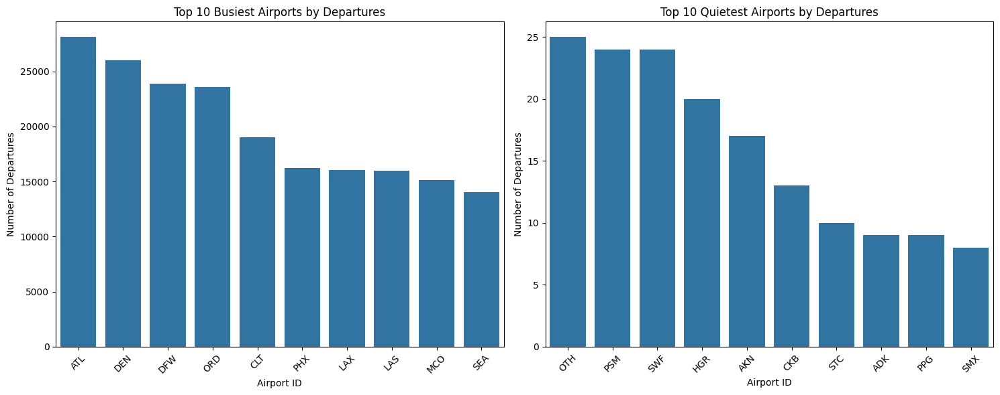

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Plot the top 10 busiest airports
flight_counts_top = df['ORIGIN'].value_counts().head(10)
sns.barplot(x=flight_counts_top.index, y=flight_counts_top.values, ax=axs[0])
axs[0].set_title('Top 10 Busiest Airports by Departures')
axs[0].set_ylabel('Number of Departures')
axs[0].set_xlabel('Airport ID')
axs[0].tick_params(axis='x', rotation=45)

# Plot the bottom 10 busiest airports
flight_counts_bottom = df['ORIGIN'].value_counts().tail(10)
sns.barplot(x=flight_counts_bottom.index, y=flight_counts_bottom.values, ax=axs[1])
axs[1].set_title('Top 10 Quietest Airports by Departures')
axs[1].set_ylabel('Number of Departures')
axs[1].set_xlabel('Airport ID')
axs[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

The bar charts depict the ten busiest and ten quietest airports by departure volume. The busiest, like ATL, may be crucial network hubs where delays could ripple through the system, whereas the quietest airports likely have a minimal impact on the network's overall delay patterns. This data is vital for managing operations, optimizing routes, and pricing delay insurance.

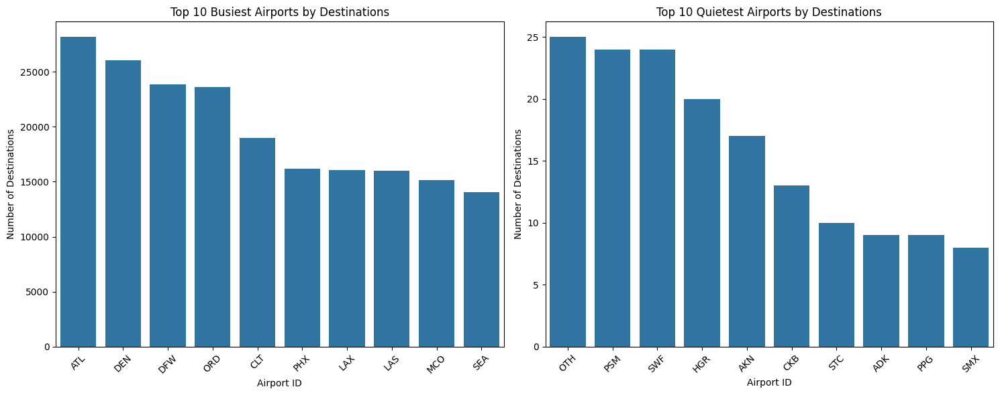

In [ ]:
# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Plot the top 10 busiest airports by destinations
flight_counts_top = df['DEST'].value_counts().head(10)
sns.barplot(x=flight_counts_top.index, y=flight_counts_top.values, ax=axs[0])
axs[0].set_title('Top 10 Busiest Airports by Destinations')
axs[0].set_ylabel('Number of Destinations')
axs[0].set_xlabel('Airport ID')
axs[0].tick_params(axis='x', rotation=45)

# Plot the top 10 quietest airports by destinations
flight_counts_bottom = df['DEST'].value_counts().tail(10)
sns.barplot(x=flight_counts_bottom.index, y=flight_counts_bottom.values, ax=axs[1])
axs[1].set_title('Top 10 Quietest Airports by Destinations')
axs[1].set_ylabel('Number of Destinations')
axs[1].set_xlabel('Airport ID')
axs[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

The charts compare the busiest and quietest US airports by number of destinations. The busiest, like Atlanta and Denver, serve thousands of destinations, making them central nodes in the flight network with a high potential for causing widespread delay propagation. On the other hand, the quietest airports, such as OTH and PSM, have minimal connections, suggesting their delays would have limited impact on the broader network. The contrast in activity levels implies that strategies to manage delays effectively should focus on the busiest airports where the potential for cascading effects is greatest.

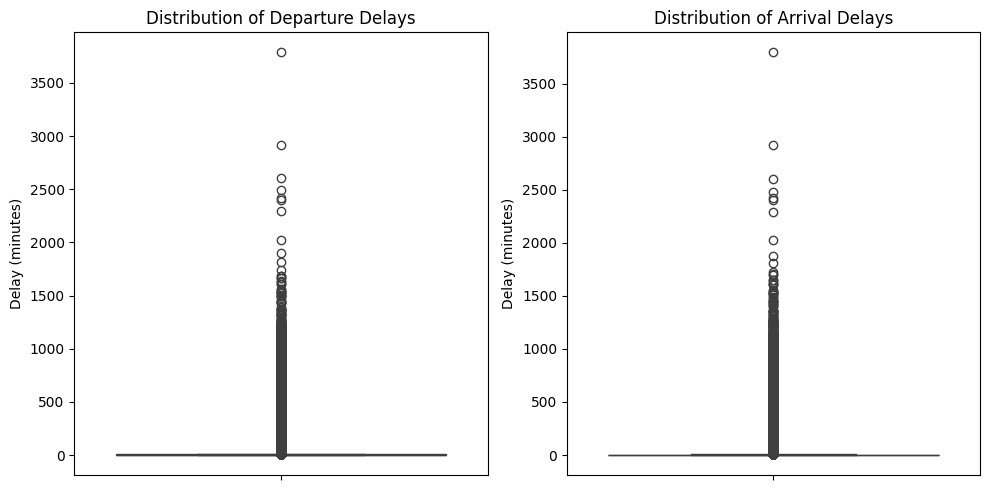

In [ ]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
sns.boxplot(y=df['DEP_DELAY_NEW'])
plt.title('Distribution of Departure Delays')
plt.ylabel('Delay (minutes)')

plt.subplot(1, 2, 2)
sns.boxplot(y=df['ARR_DELAY_NEW'])
plt.title('Distribution of Arrival Delays')
plt.ylabel('Delay (minutes)')
plt.tight_layout()
plt.show()


The charts display the distribution of departure and arrival delays for flights, showing a similar pattern: most delays cluster at the lower end of the scale with a few extreme outliers. Both types of delays have the majority of cases under 500 minutes, but a handful of delays extend up to and beyond 3000 minutes. The symmetry in delay distribution suggests that the factors causing departure delays might also impact arrival times.

Kindly reminder: as detailed at the beginning of the notebook, we will concentrate on arrival delays only!

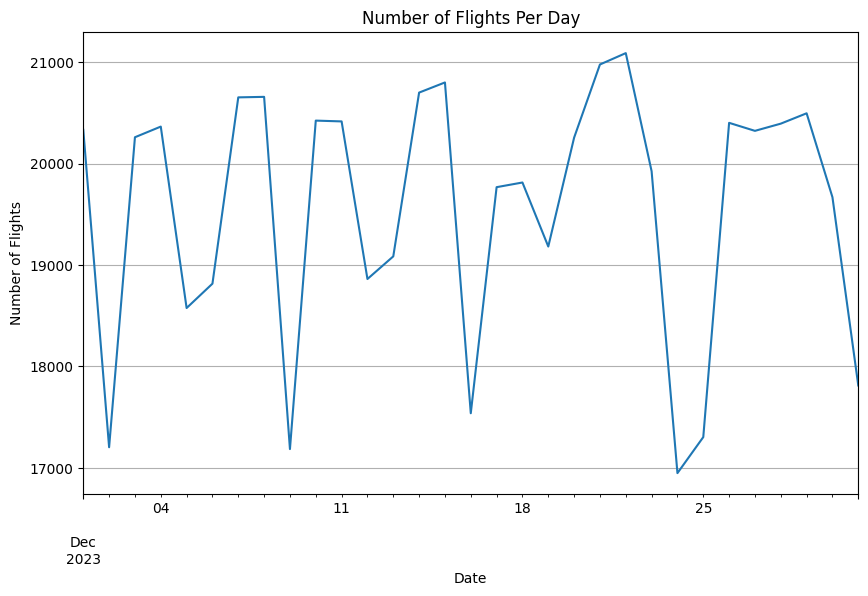

In [ ]:
# Convert FL_DATE to datetime
df['FL_DATE1'] = pd.to_datetime(df['FL_DATE'])

# Set FL_DATE as the index
df.set_index('FL_DATE1', inplace=True)

# Count the number of flights per day
daily_flights = df.resample('D').size()

# Plot the time series
daily_flights.plot(kind='line', figsize=(10, 6))
plt.title('Number of Flights Per Day')
plt.xlabel('Date')
plt.ylabel('Number of Flights')
plt.grid(True)
plt.show()


The line graph shows the number of flights per day for December 2023, with fluctuations indicating variability in daily flight volume. Notably, there are significant dips around the 11th, 18th, and 25th, which could suggest a pattern related to weekly cycles or specific events. The sharp decline on the 25th may correspond with Christmas, a day when fewer flights are typically scheduled. The data shows a range of about 18,000 to 21,000 flights per day, with the peak volumes occurring just before these dips.

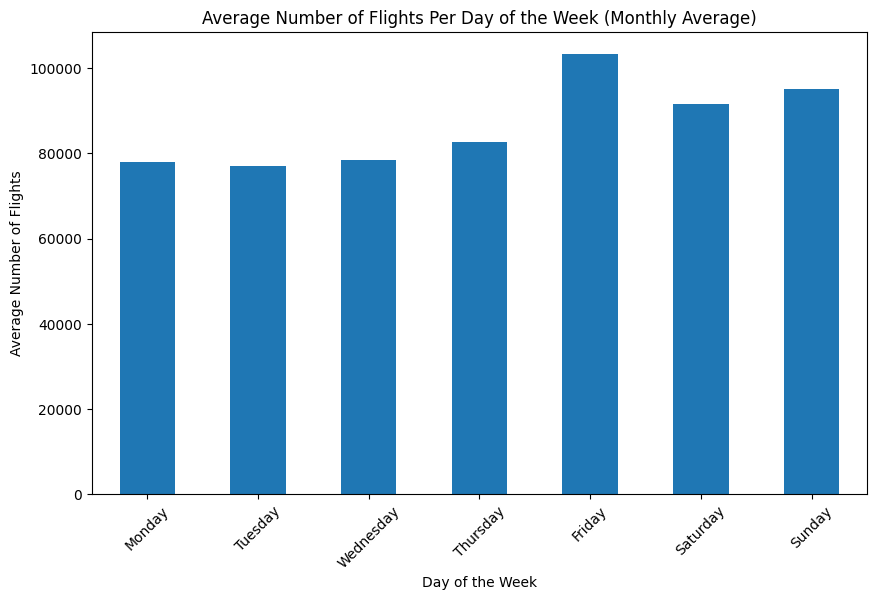

In [ ]:
# Add a column for the day of the week and month
df['DayOfWeek'] = df.index.day_name()
df['Month'] = df.index.month

# Group by month and day of the week, then count the flights, and calculate the mean
weekly_flights = df.groupby(['Month', 'DayOfWeek']).size().unstack().mean()

# Reorder the days of the week starting from Monday
ordered_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekly_flights = weekly_flights.reindex(ordered_days)

# Plot the time series
weekly_flights.plot(kind='bar', figsize=(10, 6))
plt.title('Average Number of Flights Per Day of the Week (Monthly Average)')
plt.xlabel('Day of the Week')
plt.ylabel('Average Number of Flights')
plt.xticks(rotation=45)
plt.show()

The bar chart shows the average number of flights per day of the week for a month, with the weekend days, Friday and Sunday, experiencing the highest average number of flights. The midweek days, Tuesday and Wednesday, show a lower average, while Monday and Thursday fall in between. This pattern reflects common travel behavior, with spikes on days that bracket the traditional workweek, possibly due to business travel and weekend trips.

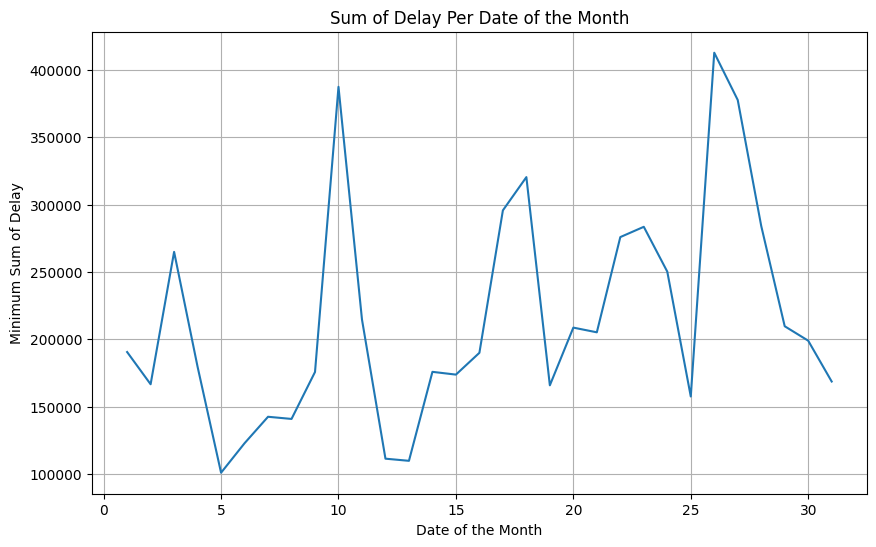

In [ ]:
# Convert FL_DATE to datetime
df['FL_DATE1'] = pd.to_datetime(df['FL_DATE'])

# Group by date and calculate the sum of arrival delays
daily_delay_sum = df.groupby(df['FL_DATE1'].dt.date)['ARR_DELAY_NEW'].sum()

# Convert the index to DatetimeIndex
daily_delay_sum.index = pd.to_datetime(daily_delay_sum.index)

# Find the minimum sum of delay for each date
min_delay_per_date = daily_delay_sum.groupby(daily_delay_sum.index.day).min()

# Plot the line graph
min_delay_per_date.plot(kind='line', figsize=(10, 6))
plt.title('Sum of Delay Per Date of the Month')
plt.xlabel('Date of the Month')
plt.ylabel('Minimum Sum of Delay')
plt.grid(True)
plt.show()


The line graph presents the total sum of delays per day over a month, revealing pronounced peaks and troughs. Notably, there are significant spikes in delays around the 5th, 15th, and 25th of the month, which may correspond to specific events or operational challenges on those days. The pattern indicates that certain days experience much higher aggregate delays, which could be important for targeted delay mitigation efforts.

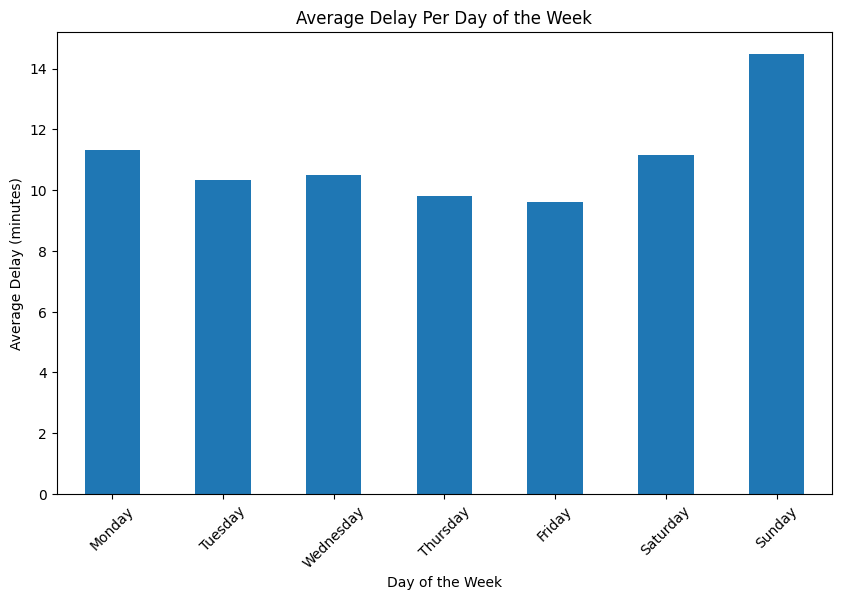

In [ ]:
# Calculate the average delay per day of the week
avg_delay_per_day = df.groupby('DayOfWeek')['ARR_DELAY_NEW'].mean()

# Reorder the days of the week starting from Monday
ordered_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
avg_delay_per_day = avg_delay_per_day.reindex(ordered_days)

# Plot the bar graph
avg_delay_per_day.plot(kind='bar', figsize=(10, 6))
plt.title('Average Delay Per Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Average Delay (minutes)')
plt.xticks(rotation=45)
plt.show()


The bar chart shows the average delay per day of the week, with Sunday experiencing the highest average delay, followed by Monday. The rest of the week has relatively lower and more consistent average delays, with the least on Wednesday. This pattern could indicate a higher volume of travel or operational challenges at the beginning and end of the week, possibly due to weekend travelers returning home or starting their trips.

## **Airport Connectivity Network**
Airport and Airline Connectivity Network Analysis
### Network Definition:
* **Nodes:** Airports and airlines
* **Edges:** Operational flights connecting airlines to airports

By considering both airports and airlines as nodes in our network, we aim to capture the holistic ecosystem of the US domestic flight sector. This approach allows us to assess the interplay between key hubs and carriers, offering a comprehensive understanding of connectivity patterns and delay propagation mechanisms.

### **Business Applications:**
* **Airport Infrastructure Development:** Airports can justify infrastructure investments based on their centrality and connectivity in the network. By understanding their role as critical nodes, airports can prioritize expansion projects and capacity enhancements to accommodate growing demand.

* **Flight Delay Insurance:** Our analysis provides the foundation for dynamic pricing models for flight delay insurance. By quantifying the structural influence of airports and airlines on delay patterns, insurers can tailor insurance products to mitigate risk and offer value-added services to travelers.

* **Traveler Insights:** Travelers can leverage network analysis to make informed decisions about flight routes and carriers. Understanding the connectivity landscape allows travelers to anticipate potential delays and choose routes with higher reliability and efficiency.

* **Investment and Strategic Decisions:** Investors and consultants can evaluate the strategic value of airports or airlines based on their centrality and connectivity in the network. This can guide investment decisions, mergers, acquisitions, or market entry strategies.

* **Logistics and Cargo Services:** The network can help logistics companies optimize their shipping routes and strategies, choosing airports with significant connectivity for quicker and more efficient cargo transport.

### Research Questions:
* **Centrality Analysis:** Which airports and airlines serve as central nodes in the US domestic flight network? How does centrality correlate with delay occurrence and propagation?

* **Impact of Network Structure:** How does the removal of a node (airport or airline) affect network connectivity and delay patterns? What are the cascading effects of disruptions on the overall network performance?

* **Identification of Critical Routes:** Which flight routes contribute significantly to delay propagation? Can we identify potential bottleneck routes and develop strategies to mitigate delays?



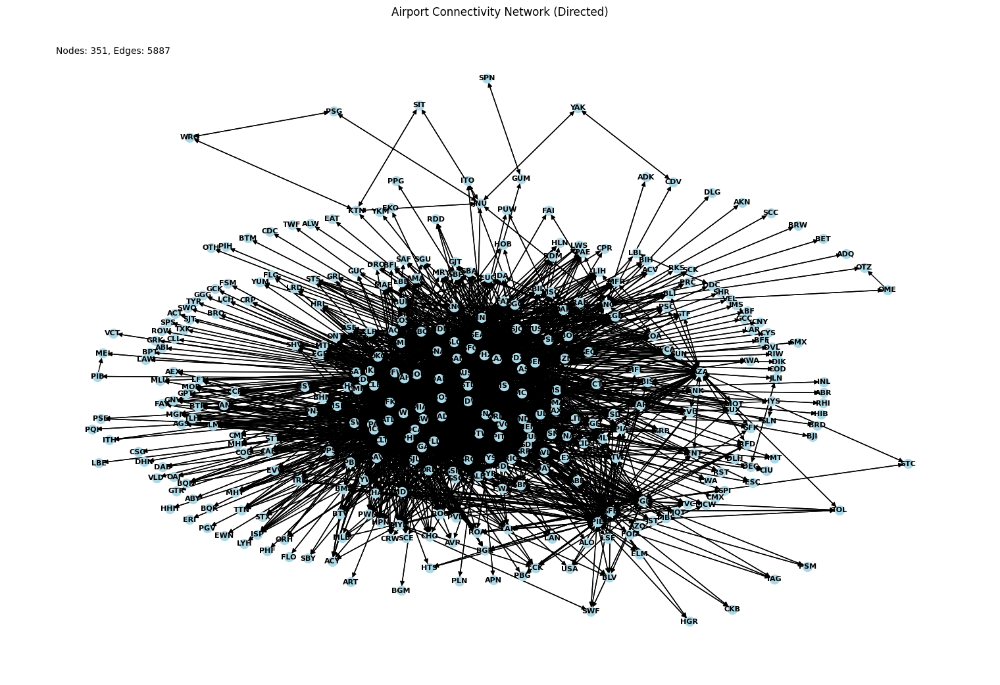

In [ ]:
# Create a directed graph
G = nx.from_pandas_edgelist(df, 'ORIGIN', 'DEST', create_using=nx.DiGraph())

# Set the layout
pos = nx.kamada_kawai_layout(G)

# Increase the figure size for better clarity
plt.figure(figsize=(15, 10))

# Draw the network with adjusted node and font sizes for better clarity
nx.draw(G, pos, with_labels=True, node_size=100, font_size=8, node_color='lightblue', font_weight='bold', arrowsize=10)

# Give the plot a title and annotate with the number of nodes and edges
plt.title("Airport Connectivity Network (Directed)")
num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()
plt.text(0.05, 0.95, f'Nodes: {num_nodes}, Edges: {num_edges}', transform=plt.gca().transAxes)

# Display the plot
plt.show()

The graph consists of 351 nodes and 5,887 edges, where nodes likely represent airports and edges represent flight routes between them. The visualization shows a highly centralized network with a dense core, suggesting that there are major hub airports with numerous direct connections to others, leading to a complex web of routes. The periphery nodes with fewer connections likely represent smaller or regional airports. The directed nature of the edges suggests that the data takes into account the directionality of flights, which could be useful for understanding traffic flows, airport importance, and route efficiency.

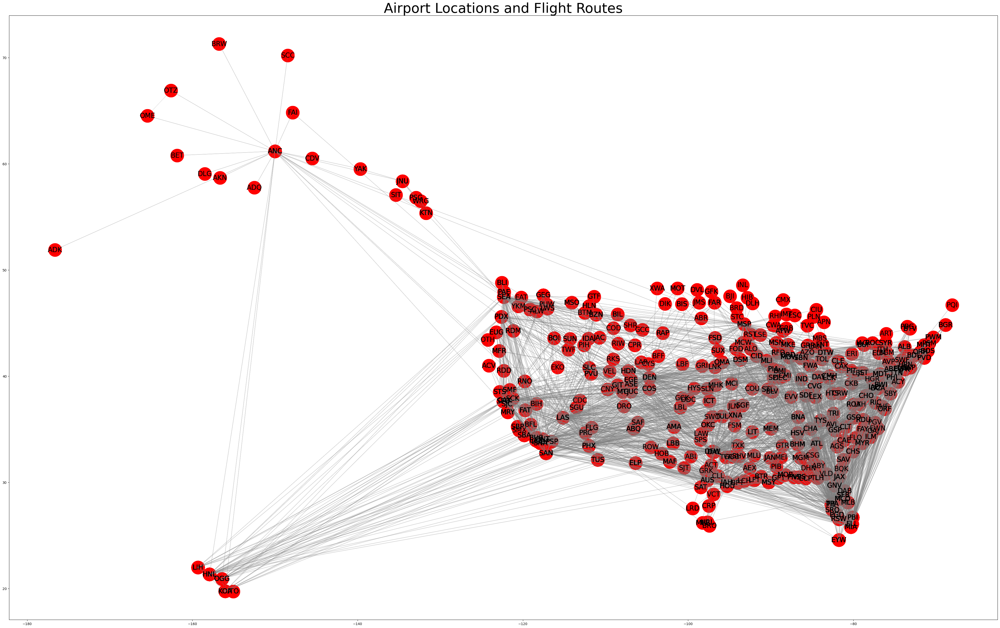

In [ ]:
merged_data_cleaned = merged_data.dropna(subset=['ORIGIN_LATITUDE', 'ORIGIN_LONGITUDE', 'DEST_LATITUDE', 'DEST_LONGITUDE'])

merged_data_cleaned = merged_data_cleaned[['ORIGIN', 'ORIGIN_LATITUDE', 'ORIGIN_LONGITUDE', 'DEST', 'DEST_LATITUDE', 'DEST_LONGITUDE']]
merged_data_cleaned = merged_data_cleaned.drop_duplicates()

plt.figure(figsize=(52, 32))

plt.scatter(merged_data_cleaned['ORIGIN_LONGITUDE'], merged_data_cleaned['ORIGIN_LATITUDE'], color='red', s=1500)
plt.scatter(merged_data_cleaned['DEST_LONGITUDE'], merged_data_cleaned['DEST_LATITUDE'], color='red', s=1500)

for _, row in merged_data_cleaned.iterrows():
    plt.arrow(row['ORIGIN_LONGITUDE'], row['ORIGIN_LATITUDE'],
              row['DEST_LONGITUDE'] - row['ORIGIN_LONGITUDE'], row['DEST_LATITUDE'] - row['ORIGIN_LATITUDE'],
              head_width=0.1, head_length=0.1, fc='gray', ec='gray', alpha=0.2)

for _, row in merged_data_cleaned.iterrows():
    plt.text(row['ORIGIN_LONGITUDE'], row['ORIGIN_LATITUDE'], row['ORIGIN'], fontsize=20, ha='center', va='center')  # Place the name in the center of the circle
    plt.text(row['DEST_LONGITUDE'], row['DEST_LATITUDE'], row['DEST'], fontsize=20, ha='center', va='center')  # Place the name in the center of the circle

plt.title('Airport Locations and Flight Routes', fontsize=40)
plt.show()

The network visualization provided offers a detailed view of the US domestic flights network's complexity. These visualizations help to identify the most connected nodes, which are presumably the largest and busiest airports.

* **Centrality and Connectivity:** The visualization clearly highlights several highly connected nodes, likely representing major hubs in the network such as ANG and ADQ, from which a large number of connections emanate. These central airports are critical for the flow of flights across the country. Their high degree of connectivity suggests they play a significant role in flight delay patterns, as any delay occurring in these hubs can cascade through the network, affecting subsequent flights at other airports.

* **Network Structure and Delay Propagation:** The spread-out nature of the network, with flights crisscrossing across the nation, shows a mix of both direct and multi-leg flights. This indicates that while some airports can directly influence many others, some can affect the network indirectly through connected routes. The network's structure, with several dense clusters and prominent hubs, aligns with the expected scale-free nature posited in the theoretical framework. This structure could help explain the propagation dynamics of delays, where initial delays at central nodes could lead to widespread impact.

* **Strategic Implications for Infrastructure and Insurance:** For airport infrastructure development, this network visualization is invaluable. It shows which airports serve as crucial nodes and thus, where investment in capacity and efficiency improvements could have the most significant impact on reducing system-wide delays. From an insurtech perspective, the visualization assists in identifying which airports and their associated routes may require higher insurance premiums due to their strategic position and higher risk of causing widespread delays.

Critical Nodes and Bottlenecks: Some airports stand out as highly central within the network, which are likely to be critical nodes. These nodes are of particular interest when considering the potential bottlenecks they could create. Strategies for mitigating delays should focus on these areas to improve the flow of traffic and reduce the potential for cascading delays.

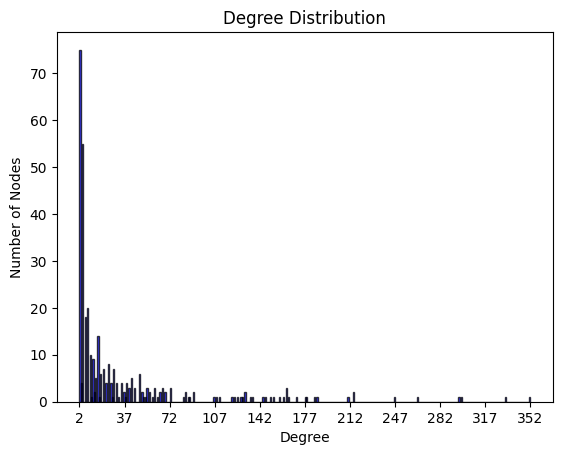

In [ ]:
G = nx.from_pandas_edgelist(df, 'ORIGIN', 'DEST', create_using=nx.DiGraph())
degrees = [degree for node, degree in G.degree()]
plt.hist(degrees, bins=range(min(degrees), max(degrees) + 1), alpha=0.75, color='blue', edgecolor='black')

plt.title('Degree Distribution')
plt.xlabel('Degree')
plt.ylabel('Number of Nodes')
plt.xticks(range(min(degrees), max(degrees) + 1, max(degrees)//10))  # Adjust the x-axis ticks
plt.show()

* **Power Law Distribution:** The degree distribution displayed in the graph is a classic indicator of a power-law distribution commonly observed in scale-free networks. The right-skewed pattern, where the majority of airports have few connections and a minority have many, is characteristic of networks where hub nodes exert substantial influence over the system's dynamics. This implies that in the US domestic flights network, a small number of airports likely function as central transfer hubs handling a significant proportion of traffic. This distribution can be directly related to the propensity for flight delays, as hubs with higher degrees of connections may face more complex logistical challenges, leading to increased potential for delays.

* **Centrality Measures:** This graph hints at the central role played by airports with a high degree of connections within the US flight network. These hubs, due to their high degree centrality, could be pivotal in understanding delay patterns. Their position within the network not only allows them to influence immediate flight schedules but also confers upon them a disproportionate ability to affect flights network-wide. The data suggests that centrality measures such as betweenness and closeness centrality should also be considered to further elucidate the influence of individual airports on delay propagation.

* **Network Resilience and Vulnerability:** The presence of nodes with a high degree within the network is a double-edged sword. On the one hand, these nodes contribute to the resilience of the network by providing multiple pathways for rerouting traffic in the event of localized failures or delays. On the other hand, their centrality makes them vulnerable to systemic risks. Delays originating at these nodes could cascade through the network, causing widespread disruption. Consequently, understanding the robustness of these high-degree nodes is crucial in predicting the network's capacity to withstand and recover from delays, informing both infrastructure investment and operational strategies.

* **Implications for Flight Delay Insurance:** The insights derived from the degree distribution are particularly relevant for dynamic pricing models in flight delay insurance. Insurance providers could use the network centrality of airports as a risk factor in their pricing algorithms. Higher premiums could be justified for flights involving central hubs, reflecting the greater risk of delay-induced disruptions. Conversely, flights involving less central airports might be offered lower premiums, promoting cost-effectiveness and competitive pricing in the insurance market.

In summary, the degree distribution graph is a useful starting point for analyzing the US domestic flights network. It suggests a scale-free network with a few highly connected nodes and many nodes with fewer connections.


In [ ]:
density = nx.density(G)
print(f"Network Density: {density}")

Network Density: 0.04792022792022792


The network density is a measure of how many edges are in the network compared to how many edges there could possibly be. In a flight network, this would relate to how many direct flight routes exist between airports compared to the total number of possible direct connections.
With a network density of approximately 0.0479 (or 4.79%), this indicates that less than 5% of all possible direct connections between airports are being used. This is typical for transportation networks where it's impractical to have direct connections between every single node (airport) due to economic, geographic, and operational constraints.

The network density is a measure of how many edges are in the network compared to how many edges there could possibly be. In a flight network, this would relate to how many direct flight routes exist between airports compared to the total number of possible direct connections.
With a network density of approximately 0.0479 (or 4.79%), this indicates that less than 5% of all possible direct connections between airports are being used. This is typical for transportation networks where it's impractical to have direct connections between every single node (airport) due to economic, geographic, and operational constraints.

Here are a few analytical insights based on the network density figure:

* **Selective Connectivity:** The network density figure of approximately 4.79% indicates a selective approach to connectivity among airports in the US domestic flights network.

* **Operational Optimization:** The sparsity of the network suggests an optimization for economic and operational efficiency over a fully connected network.

* **Scale-Free Characteristics:** Aligns with the expected scale-free network topology where a few hubs are highly connected, and many nodes have limited connections.

* **Resilience to Random Failures:** The low density suggests the network is designed to be resilient to random node failures, as isolated disruptions are unlikely to affect the entire network.

* **Vulnerability to Hub Disruptions:** Highly connected hubs represent points of vulnerability; disruptions here could lead to significant systemic delays.

* **Delay Propagation Impact:** Delays at less connected nodes are likely to have localized effects, whereas delays at central hubs could have widespread network implications.

* **Insurtech Industry Applications:** The density metric assists insurtech companies in risk assessment for delay propagation, influencing dynamic pricing models for flight delay insurance products.

* **Strategic Hub Importance:** The analysis highlights the critical role of certain hubs in managing delay risks and the potential for targeted operational improvements.

* **Insight for Infrastructure Development:** Identifies points where infrastructure investment could enhance efficiency and suggests areas where new routes may be economically viable.

In conclusion,  Based on the network density of the US domestic flights network it suggests a system that is designed for efficiency with a certain level of redundancy, offering opportunities for optimization and potential expansion to better serve the market while also maintaining robustness against network disruptions.

In [ ]:
G = nx.from_pandas_edgelist(df, 'ORIGIN', 'DEST', create_using=nx.DiGraph())

# Calculate centrality measures
closeness_centrality = nx.closeness_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
degree_centrality = nx.degree_centrality(G)
clustering_coefficient = nx.clustering(G)

# Calculate minimum, maximum, and average values for each centrality measure
min_closeness = min(closeness_centrality.values())
max_closeness = max(closeness_centrality.values())
avg_closeness = round(sum(closeness_centrality.values()) / len(closeness_centrality), 4)

min_betweenness = min(betweenness_centrality.values())
max_betweenness = max(betweenness_centrality.values())
avg_betweenness = round(sum(betweenness_centrality.values()) / len(betweenness_centrality), 4)

min_degree = min(degree_centrality.values())
max_degree = max(degree_centrality.values())
avg_degree = round(sum(degree_centrality.values()) / len(degree_centrality), 4)

min_clustering = min(clustering_coefficient.values())
max_clustering = max(clustering_coefficient.values())
avg_clustering = round(sum(clustering_coefficient.values()) / len(clustering_coefficient), 4)

# Find nodes with minimum and maximum values for each centrality measure
min_closeness_node = [node for node, value in closeness_centrality.items() if value == min_closeness][0]
max_closeness_node = [node for node, value in closeness_centrality.items() if value == max_closeness][0]

min_betweenness_node = [node for node, value in betweenness_centrality.items() if value == min_betweenness][0]
max_betweenness_node = [node for node, value in betweenness_centrality.items() if value == max_betweenness][0]

min_degree_node = [node for node, value in degree_centrality.items() if value == min_degree][0]
max_degree_node = [node for node, value in degree_centrality.items() if value == max_degree][0]

min_clustering_node = [node for node, value in clustering_coefficient.items() if value == min_clustering][0]
max_clustering_node = [node for node, value in clustering_coefficient.items() if value == max_clustering][0]

# Create a table
table = [
    ["Closeness Centrality", min_closeness, max_closeness, avg_closeness, min_closeness_node, max_closeness_node],
    ["Betweenness Centrality", min_betweenness, max_betweenness, avg_betweenness, min_betweenness_node, max_betweenness_node],
    ["Degree Centrality", min_degree, max_degree, avg_degree, min_degree_node, max_degree_node],
    ["Clustering Coefficient", min_clustering, max_clustering, avg_clustering, min_clustering_node, max_clustering_node]
]

# Print the table
print(tabulate(table, headers=["Measure", "Minimum", "Maximum", "Average", "Node with Minimum", "Node with Maximum"], tablefmt="fancy_grid"))

╒════════════════════════╤════════════╤═══════════╤═══════════╤═════════════════════╤═════════════════════╕
│ Measure                │    Minimum │   Maximum │   Average │ Node with Minimum   │ Node with Maximum   │
╞════════════════════════╪════════════╪═══════════╪═══════════╪═════════════════════╪═════════════════════╡
│ Closeness Centrality   │ 0.250716   │  0.652985 │    0.4237 │ SPN                 │ DFW                 │
├────────────────────────┼────────────┼───────────┼───────────┼─────────────────────┼─────────────────────┤
│ Betweenness Centrality │ 0          │  0.18196  │    0.0041 │ DAB                 │ DFW                 │
├────────────────────────┼────────────┼───────────┼───────────┼─────────────────────┼─────────────────────┤
│ Degree Centrality      │ 0.00571429 │  1.00571  │    0.0958 │ FSM                 │ DFW                 │
├────────────────────────┼────────────┼───────────┼───────────┼─────────────────────┼─────────────────────┤
│ Clustering Coefficient │ 0

In [ ]:
def plot_horizontal_bar_chart(measure_name, centrality_values, average_value):
    # Sort centrality values
    sorted_values = sorted(centrality_values.items(), key=lambda x: x[1], reverse=True)

    # Node identifiers (destination/origin names)
    labels = [node for node, _ in sorted_values]

    # Sorted centrality values
    sorted_centrality_values = [value for _, value in sorted_values]

    # Set the figure size for better visibility
    plt.figure(figsize=(10, 50))

    # Create horizontal bar chart
    plt.barh(range(len(sorted_centrality_values)), sorted_centrality_values, align='center', alpha=0.7)

    # Set y-axis labels
    plt.yticks(range(len(sorted_centrality_values)), labels)

    # Draw average line
    plt.axvline(x=average_value, color='r', linestyle='--', label=f'Average {measure_name}')

    # Set labels and title
    plt.ylabel('Node (Airport)')
    plt.xlabel(measure_name)
    plt.title(f'{measure_name} for Each Node (Airport)')

    # Add legend
    plt.legend()

    # Ensure layout fits the labels
    plt.tight_layout()

    # Show the plot
    plt.show()

**Closeness centrality** is a measure of how close a node is to all other nodes in the network, calculated by the inverse of the average shortest path length from a given node to all other nodes. It indicates how long it will take to spread information from that node to others in the network.

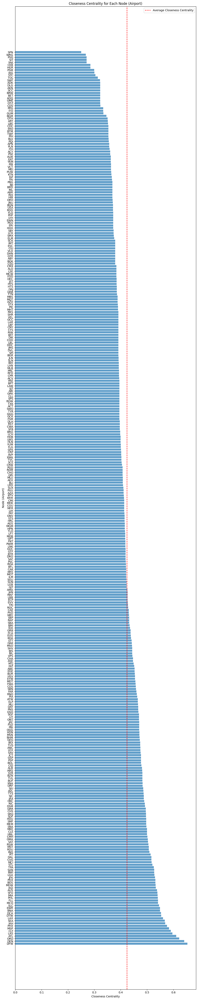

In [ ]:
plot_horizontal_bar_chart('Closeness Centrality', closeness_centrality, avg_closeness)

The closeness centrality chart shows significant variation among US airports, indicating that while a few airports serve as major hubs with high efficiency in connecting to others, most have lower centrality, suggesting limited direct connectivity. The airports with centrality above the average (indicated by the dashed line) are critical for network efficiency and could be focal points for minimizing systemic delays. Conversely, airports with lower centrality may represent opportunities for connectivity improvements to enhance the overall network performance. This insight can guide operational enhancements and strategic planning for airlines and airport authorities.

**Betweenness centrality** is a measure of how often a node appears on the shortest paths between other nodes. A higher betweenness centrality indicates that a node acts as a bridge between different parts of the network.

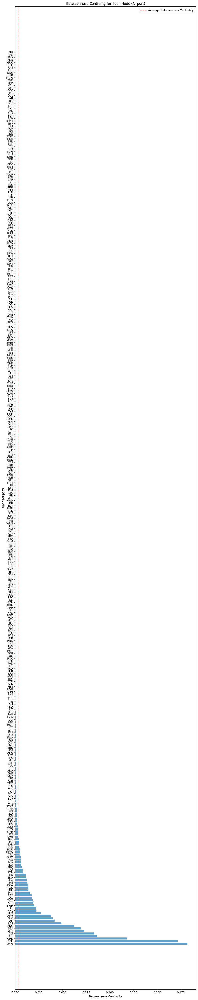

In [ ]:
plot_horizontal_bar_chart('Betweenness Centrality', betweenness_centrality, avg_betweenness)

The betweenness centrality chart reveals that airports with high centrality scores are crucial for the flow and connectivity of the US domestic flights network, acting as pivotal transfer points and potentially indicating congestion risks. These airports are vital for network robustness, as their disruption could significantly impact overall connectivity. The analysis suggests that strategic interventions at these high-centrality airports could enhance network efficiency and reduce the likelihood of cascading delays across the system.

**Degree centrality** refers to the number of connections that a node has. In our case, it measures how many direct flight routes are connected to each airport.

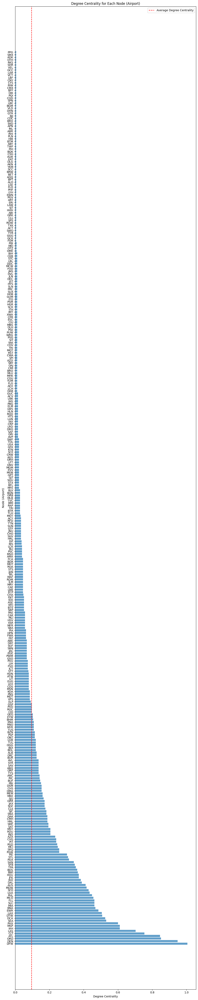

In [ ]:
plot_horizontal_bar_chart('Degree Centrality', degree_centrality, avg_degree)

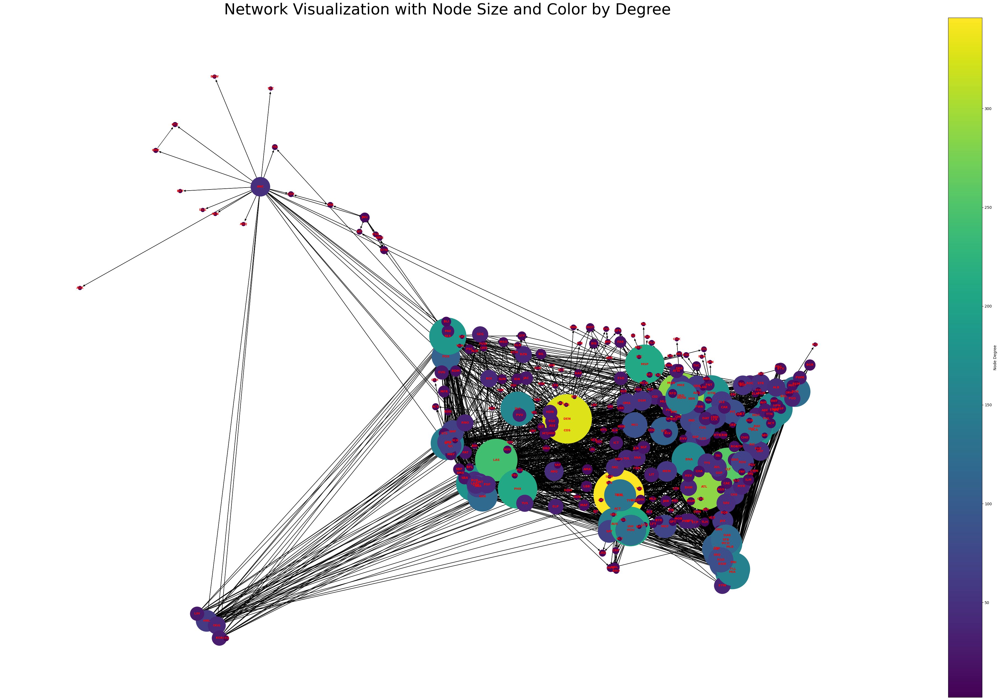

In [ ]:
merged_data_cleaned = merged_data.dropna(subset=['ORIGIN_LATITUDE', 'ORIGIN_LONGITUDE', 'DEST_LATITUDE', 'DEST_LONGITUDE','DEST','ORIGIN'])
G1 = nx.from_pandas_edgelist(merged_data_cleaned, 'ORIGIN', 'DEST', create_using=nx.DiGraph())

# Extract geographical coordinates of airports
origin_coordinates = {node: (merged_data_cleaned.loc[merged_data_cleaned['ORIGIN'] == node, 'ORIGIN_LONGITUDE'].iloc[0], merged_data_cleaned.loc[merged_data_cleaned['ORIGIN'] == node, 'ORIGIN_LATITUDE'].iloc[0]) for node in G1.nodes()}
dest_coordinates = {node: (merged_data_cleaned.loc[merged_data_cleaned['DEST'] == node, 'DEST_LONGITUDE'].iloc[0], merged_data_cleaned.loc[merged_data_cleaned['DEST'] == node, 'DEST_LATITUDE'].iloc[0]) for node in G1.nodes()}

# Position nodes using geographical coordinates
pos_origin = {node: (coord[0], coord[1]) for node, coord in origin_coordinates.items()}
pos_dest = {node: (coord[0], coord[1]) for node, coord in dest_coordinates.items()}

# Calculate node degrees
node_degrees = dict(G1.degree())
node_sizes = [v * 50 for v in node_degrees.values()]
node_colors = list(node_degrees.values())

plt.figure(figsize=(52, 32))
nodes = nx.draw_networkx_nodes(G1, pos_origin, node_size=node_sizes, node_color=node_colors, cmap=plt.cm.viridis)
edges = nx.draw_networkx_edges(G1, pos_origin)
nx.draw_networkx_labels(G1, pos_origin, font_size=8, font_weight='bold', font_color='red')
plt.colorbar(nodes, label='Node Degree')
plt.axis('off')
plt.title('Network Visualization with Node Size and Color by Degree', fontsize=40)
plt.show()

A higher degree centrality indicates that an airport is a hub with many direct flights, which could influence the prevalence of flight delays and distribution of flight frequencies. The graph shows that most airports have a low degree centrality with a few exceptions, highlighting the hub-and-spoke nature of the flight network. These hubs with high degree centrality are likely to be the most influential in terms of network dynamics and could be critical in terms of delay propagation and strategic planning for airlines and airport authorities.

In [ ]:
# Sort centrality measures in descending order and get top 10 nodes
top_10_closeness = sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
top_10_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
top_10_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:10]

# Create table for top 10 nodes in each measure
top_10_table = []
for i in range(10):
    row = []
    if i < len(top_10_closeness):
        row.append(top_10_closeness[i])
    else:
        row.append(None)
    if i < len(top_10_betweenness):
        row.append(top_10_betweenness[i])
    else:
        row.append(None)
    if i < len(top_10_degree):
        row.append(top_10_degree[i])
    else:
        row.append(None)
    top_10_table.append(row)

# Print the table
print(tabulate(top_10_table, headers=["Closeness Centrality", "Betweenness Centrality", "Degree Centrality"], tablefmt="fancy_grid"))


# Extract airports from the top 10 lists of each centrality measure
top_10_closeness_airports = set([node for node, _ in top_10_closeness])
top_10_betweenness_airports = set([node for node, _ in top_10_betweenness])
top_10_degree_airports = set([node for node, _ in top_10_degree])

# Find airports that appear in all indexes
common_airports = top_10_closeness_airports.intersection(top_10_betweenness_airports, top_10_degree_airports)

# Find airports that don't appear in all indexes
unique_airports = top_10_closeness_airports.union(top_10_betweenness_airports, top_10_degree_airports) - common_airports

# Print the results
print("Airports that appear in all indexes:")
print(common_airports)
print("\nAirports that don't appear in all indexes:")
print(unique_airports)

╒═════════════════════════════╤══════════════════════════════╤═════════════════════════════╕
│ Closeness Centrality        │ Betweenness Centrality       │ Degree Centrality           │
╞═════════════════════════════╪══════════════════════════════╪═════════════════════════════╡
│ ('DFW', 0.6529850746268657) │ ('DFW', 0.18195951125235624) │ ('DFW', 1.0057142857142858) │
├─────────────────────────────┼──────────────────────────────┼─────────────────────────────┤
│ ('DEN', 0.6410256410256411) │ ('DEN', 0.17164857660520916) │ ('DEN', 0.9485714285714286) │
├─────────────────────────────┼──────────────────────────────┼─────────────────────────────┤
│ ('ORD', 0.6216696269982238) │ ('ORD', 0.11784438373052222) │ ('ORD', 0.8514285714285714) │
├─────────────────────────────┼──────────────────────────────┼─────────────────────────────┤
│ ('ATL', 0.6108202443280978) │ ('ATL', 0.08615170623576728) │ ('ATL', 0.8457142857142858) │
├─────────────────────────────┼──────────────────────────────┼────────

### Centrality Analysis: Which airports and airlines serve as central nodes in the US domestic flight network?
#### **The top central airports are 'LAS', 'MSP', 'DFW', 'ORD', 'SEA', 'CLT', 'IAH', 'DEN', 'ATL'.**

Based on the provided centrality measures—closeness centrality, betweenness centrality, and degree centrality—the airports that appear in all the top indexes are considered the most central. Here's an explanation for why we focus on these airports:

Consistency Across Measures: When an airport consistently appears among the top-ranked nodes in all three centrality measures, it indicates that the airport holds a prominent position in the network regardless of the specific measure used. This consistency suggests that the airport is crucial in terms of its closeness to other nodes, its influence over shortest paths, and its connectivity within the network.

Multifaceted Importance: Closeness centrality reflects how quickly a node can interact with other nodes in the network, betweenness centrality measures the node's influence over communication between other nodes, and degree centrality signifies the node's overall connectivity. Airports that excel in all these aspects are likely to play a central role in facilitating efficient and effective air travel.

Overall Network Impact: By focusing on airports that consistently rank high across multiple centrality measures, we prioritize nodes that have a significant impact on the overall structure and functioning of the air transportation network. These airports are crucial hubs that contribute substantially to the network's efficiency, resilience, and accessibility.

Reliable Connectivity: Airports appearing in all top indexes are likely to serve as major transit points, offering reliable connectivity to a wide range of destinations. Passengers and cargo traveling through these airports benefit from enhanced accessibility and smoother travel experiences due to the efficient routing facilitated by these central hubs.

In summary, by identifying airports that consistently rank among the top nodes across various centrality measures, we pinpoint key hubs that play a pivotal role in shaping the overall dynamics and effectiveness of the air transportation network.

In [ ]:
tail_10_closeness = sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=False)[:20]
tail_10_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=False)[:153]
tail_10_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=False)[:75]

tail_10_table = []
for i in range(153):
    row = []
    if i < len(tail_10_closeness):
        row.append(tail_10_closeness[i])
    else:
        row.append(None)
    if i < len(tail_10_betweenness):
        row.append(tail_10_betweenness[i])
    else:
        row.append(None)
    if i < len(tail_10_degree):
        row.append(tail_10_degree[i])
    else:
        row.append(None)
    tail_10_table.append(row)

print(tabulate(tail_10_table, headers=["Closeness Centrality", "Betweenness Centrality", "Degree Centrality"], tablefmt="fancy_grid"))

tail_10_closeness_airports = set([node for node, _ in tail_10_closeness])
tail_10_betweenness_airports = set([node for node, _ in tail_10_betweenness])
tail_10_degree_airports = set([node for node, _ in tail_10_degree])

common_tail_airports = tail_10_closeness_airports.intersection(tail_10_betweenness_airports, tail_10_degree_airports)

unique_tail_airports = tail_10_closeness_airports.union(tail_10_betweenness_airports, tail_10_degree_airports) - common_tail_airports

print("Airports that appear in all tail indexes:")
print(common_tail_airports)
print("\nAirports that don't appear in all tail indexes:")
print(unique_tail_airports)

╒══════════════════════════════╤══════════════════════════╤═══════════════════════════════╕
│ Closeness Centrality         │ Betweenness Centrality   │ Degree Centrality             │
╞══════════════════════════════╪══════════════════════════╪═══════════════════════════════╡
│ ('SPN', 0.2507163323782235)  │ ('DAB', 0.0)             │ ('FSM', 0.005714285714285714) │
├──────────────────────────────┼──────────────────────────┼───────────────────────────────┤
│ ('WRG', 0.2679938744257274)  │ ('FAT', 0.0)             │ ('GCK', 0.005714285714285714) │
├──────────────────────────────┼──────────────────────────┼───────────────────────────────┤
│ ('YAK', 0.27068832173240526) │ ('BFL', 0.0)             │ ('GGG', 0.005714285714285714) │
├──────────────────────────────┼──────────────────────────┼───────────────────────────────┤
│ ('SIT', 0.27068832173240526) │ ('AVP', 0.0)             │ ('TYR', 0.005714285714285714) │
├──────────────────────────────┼──────────────────────────┼─────────────────────

#### **The least central airports are 'DLG', 'ADK', 'SPN', 'BET', 'BRW', 'AKN', 'SCC', and 'ADQ'.**
The airports that appear in all tail indexes — 'DLG', 'ADK', 'SPN', 'BET', 'BRW', 'AKN', 'SCC', 'ADQ' — consistently show up at the bottom across all three centrality measures: closeness, betweenness, and degree. These measures provide different lenses through which the centrality of an airport in the network can be understood:

Closeness Centrality tells us how easily other airports can be reached from a given airport.
Betweenness Centrality indicates how often an airport serves as a connector or a stopover point for routes between other airports.
Degree Centrality measures how many direct connections an airport has.

For an airport to be considered non-central, it would typically score low across all these centrality measures, indicating that:
* It is not quickly reachable from other airports (low closeness).
* It is not a common point through which flights travel to get from one airport to another (low betweenness).
* It does not have a large number of direct routes to other airports (low degree).

The listed airports appear at the tail end of each centrality measure's distribution, suggesting they have limited connectivity within the network and do not significantly influence the flow of traffic. This consistent positioning across all three metrics makes them prime candidates for being characterized as the most non-central airports within the network.

In [ ]:
number_of_components = nx.number_connected_components(G.to_undirected())
print(f"Number of connected components: {number_of_components}")

# Find the largest connected component
largest_component = max(nx.connected_components(G.to_undirected()), key=len)

# Calculate the fraction of nodes in the largest component
fraction_in_largest_component = len(largest_component) / G.number_of_nodes()
print(f"Fraction of nodes in the largest connected component: {fraction_in_largest_component}")


Number of connected components: 1
Fraction of nodes in the largest connected component: 1.0


Community 0: JFK, MSN, BOS, STL, PHL, LGA, DCA, BDL, DTW, MIA, CLE, SAT, EYW, SDF, ROC, BHM, GSO, CHS, JAX, RIC, IND, EWR, MKE, TYS, RDU, RSW, TPA, ORF, PWM, MCO, MCI, MEM, MSY, PIT, BWI, MYR, BUF, PBI, PVD, SAV, FLL, SYR, CMH, CAE, GRR, CVG, ALB, IAD, ILM, GSP, BTV, HPN, ORH, MHT, LAN, ART, MDW, PLN, APN, ITH, BGM, ISP, TTN, ACY, LBE, PQI
Community 1: ANC, FAI, JNU, OME, OTZ, ADQ, BET, BRW, SCC, KTN, CDV, YAK, SIT, PSG, WRG, AKN, DLG, ADK
Community 2: CLT, OMA, ATL, DAB, CID, BNA, LEX, AVP, DSM, SRQ, FSD, MDT, XNA, AVL, AEX, SBN, TLH, ATW, FWA, FAR, BTR, SGF, HSV, TRI, MLU, CHA, EVV, MGM, PIA, BMI, MLI, GNV, DAY, LFT, CHO, ROA, TVC, AGS, ABE, CAK, BGR, FAY, MLB, ERI, PGV, OAJ, EWN, LYH, PHF, SBY, FLO, HTS, FNT, CSG, BQK, ABY, ELM, GTR, DHN, VLD, PIE, PBG, RFD, HGR, SFB, LCK, TOL, PGD, PSM, BLV, IAG, CKB, SWF, STC
Community 3: DFW, ECP, LBB, MFE, VPS, IAH, TUL, LIT, PNS, AMA, MTJ, FSM, GCK, GGG, TYR, LCH, SWO, ACT, FLG, TXK, ROW, GRI, MAF, SPS, JAN, HOU, CLL, GPT, GRK, MOB, HRL, LRD, A

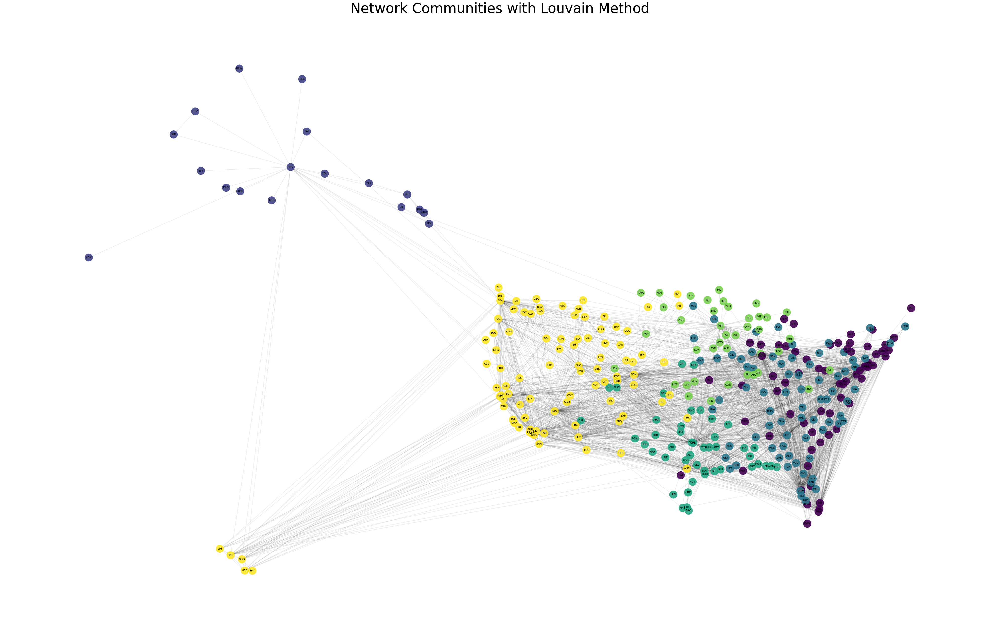

In [ ]:
G_undirected = G1.to_undirected()

partitions = community_louvain.best_partition(G_undirected, random_state=42)

community_groups = {community: [] for community in set(partitions.values())}

for node, community in partitions.items():
    community_groups[community].append(node)

for community, nodes in community_groups.items():
    print(f"Community {community}: {', '.join(nodes)}")

community_colors = [partitions[node] for node in G_undirected.nodes()]

coordinates = {}
for node in G_undirected.nodes():
    origin_data = merged_data_cleaned.loc[merged_data_cleaned['ORIGIN'] == node, ['ORIGIN_LONGITUDE', 'ORIGIN_LATITUDE']]
    dest_data = merged_data_cleaned.loc[merged_data_cleaned['DEST'] == node, ['DEST_LONGITUDE', 'DEST_LATITUDE']]

    if not origin_data.empty:
        coordinates[node] = (origin_data['ORIGIN_LONGITUDE'].values[0], origin_data['ORIGIN_LATITUDE'].values[0])
    elif not dest_data.empty:
        coordinates[node] = (dest_data['DEST_LONGITUDE'].values[0], dest_data['DEST_LATITUDE'].values[0])

plt.figure(figsize=(52, 32))
nx.draw_networkx_nodes(G_undirected, pos=coordinates, node_size=500, cmap=plt.get_cmap('viridis'), node_color=community_colors, alpha=0.9)
nx.draw_networkx_edges(G_undirected, pos=coordinates, alpha=0.09)

node_labels = {node: node for node in G_undirected.nodes()}
nx.draw_networkx_labels(G_undirected, pos=coordinates, labels=node_labels, font_size=8, font_color='black')

plt.title('Network Communities with Louvain Method', fontsize=40)
plt.axis('off')
plt.show()

The network visualization using the Louvain method has delineated several distinct communities, which represent clusters of airports that are more densely interconnected with each other than with those in other communities. This kind of segmentation is critical for understanding the structure and connectivity within the network.

Community 0 exhibits a substantial cluster, suggesting a grouping of airports with frequent direct routes between them. This can be indicative of a major transportation hub system, perhaps covering key areas or cities that handle a high volume of traffic and serve as central nodes facilitating travel between numerous other locations.

* Community 1 consists of airports that are possibly located in geographically challenging or less populated areas, given the smaller number of nodes. These could be areas with specialized or limited travel demands, such as remote or regional destinations, and the connectivity within this community suggests these airports rely on a select few hubs for broader network access.

* Community 2 might represent a set of regional airports that connect less densely populated or suburban areas to larger hubs. The number of airports and the density of connections within this community suggest a moderately busy network section with significant through-traffic.

* Community 3 likely contains airports in the Southern and South-central United States, considering the geographic distribution of certain known airports. These nodes serve not only local and regional traffic but may also be important for connecting to international destinations to the south.

* Community 4 might encompass airports in the Northern and Central regions, including some which may cater to less dense populations. The airports within this community likely experience seasonal travel patterns due to weather variations.

* Community 5 seems to include airports from the Western United States, many of which are key tourist destinations or significant metropolitan areas with heavy air traffic.

Each community, as determined by the Louvain method, reflects a functional grouping within the network, likely influenced by geography, population density, economic factors, and travel patterns. These communities' structures are instrumental for airlines and airport authorities to consider when planning route expansions, managing traffic flows, and strategizing for economic development.

This histogram displays the frequency of pairwise distances between nodes in a network. The x-axis shows the number of distance units (likely representing the number of steps in a path), while the y-axis represents the frequency of these distances occurring between node pairs.

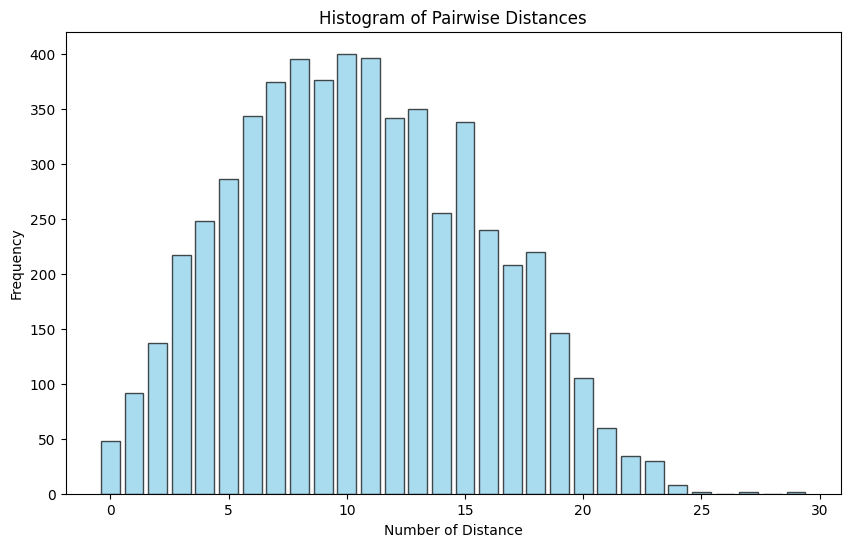

In [ ]:
all_pairwise_distances = []
for u, v in G1.edges():
    distance = np.sqrt((pos[u][0] - pos[v][0])**2 + (pos[u][1] - pos[v][1])**2)
    all_pairwise_distances.append(distance)

hist, bins = np.histogram(all_pairwise_distances, bins=30)

plt.figure(figsize=(10, 6))
plt.bar(range(len(hist)), hist, color='skyblue', edgecolor='black', alpha=0.7)
plt.xlabel('Number of Distance')
plt.ylabel('Frequency')
plt.title('Histogram of Pairwise Distances')
plt.show()

The histogram of pairwise distances suggests that the network exhibits small-world characteristics, with most nodes being reachable within approximately 6 to 10 units. This indicates a high level of interconnectedness, contributing to efficient pathfinding and robustness within the network. While there are fewer long-distance connections, the overall distribution implies a balance between local clustering and global connectivity, making it well-suited for transportation or communication purposes.

**Clustering coefficient** is a measure of the degree to which nodes in a network tend to cluster together. In other words, it reflects how likely it is that two airports with a common destination are directly connected themselves.

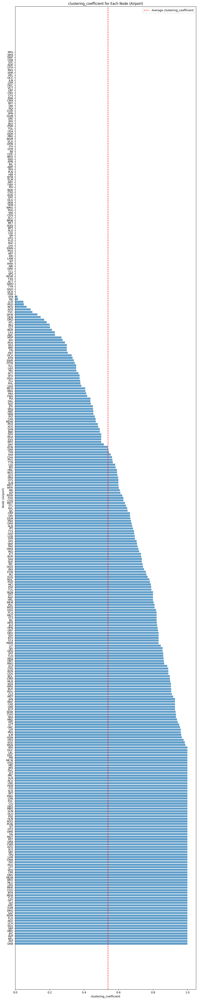

In [ ]:
plot_horizontal_bar_chart("clustering_coefficient",clustering_coefficient,avg_clustering)

In [ ]:
clustering_coefficient = nx.average_clustering(G)
avg_shortest_path_length = nx.average_shortest_path_length(G)

    # Print the values
print("Clustering Coefficient:", clustering_coefficient)
print("Average Shortest Path Length:", avg_shortest_path_length)

# Determine if it exhibits small world phenomenon
if clustering_coefficient > 2 * avg_shortest_path_length:
  print("The network exhibits the small-world phenomenon.")
else:
  print("The network does not exhibit the small-world phenomenon.")

Clustering Coefficient: 0.5388960443519979
Average Shortest Path Length: 2.4174114774114774
The network does not exhibit the small-world phenomenon.


The network's high clustering coefficient of approximately 0.539 is emblematic of a robust system where airports form tight-knit groups, indicating strong regional connectivity. This structure is likely to contribute to the network's resilience by providing redundant routes that can be beneficial in the event of local disruptions. On the flip side, this tight clustering could also lead to quicker spread of delays within these regional groups, making them susceptible to localized cascading effects.

While the clustering coefficient might suggest a small-world network, the average shortest path length of about 2.417, though indicating efficient connectivity, does not align with the small-world property. This discrepancy may be due to the network's size and the connectivity scale, suggesting that the US domestic flights network operates differently from a textbook small-world network. It may not experience the same level of efficiency in terms of the average number of steps taken to travel from one node to any other in the network.

This information is crucial for our analysis of delay patterns in relation to network structure. The presence of tight clusters can inform us about the risk of delay propagation, as well as identify key nodes for implementing strategies that could help minimize the impact of such delays. Additionally, understanding the average shortest path length helps us in forecasting the potential rapidity of delay spread and the resilience of the network to disruptions.

For the development of a dynamic pricing model for flight delay insurance, these metrics are valuable. They suggest the need for a differentiated approach where tightly connected clusters may require different pricing strategies compared to more sparsely connected regions. This could enhance the accuracy of risk assessment and pricing, thereby improving the market viability of the insurance product.

In conclusion, while the network displays attributes of high clustering and efficient connectivity, it deviates from the small-world model, highlighting the need for a nuanced understanding of its operational dynamics for both delay management and business applications in the insurtech sector.

In [ ]:
# Calculate the diameter of the graph
diameter = nx.diameter(G_undirected)

print("The diameter of the graph is:", diameter)

The diameter of the graph is: 5


The network's diameter of 5 suggests a highly interconnected US domestic flight network, where the maximum number of stops to connect any two airports is minimal. This structure underscores the network's efficiency in providing a wide array of route options across vast distances, enhancing the potential for resilience against localized disruptions. However, this tight interconnection also implies that delays can rapidly propagate through the network, affecting a broad range of nodes within a few steps. This characteristic is critical for modeling the impact of delays and informs strategies for minimizing systemic risks within the network.


In [ ]:
# Initialize a list to store the pairs of nodes involved in the diameter 5 paths
pairs_in_max_diameter_paths = []

# Find all pairs of nodes that contribute to the diameter 5 paths
for node1 in G_undirected.nodes():
    for node2 in G_undirected.nodes():
        if nx.shortest_path_length(G_undirected, node1, node2) == diameter:
            # Add the pair of nodes to the list
            pairs_in_max_diameter_paths.append((node1, node2))

# Print the pairs of nodes involved in the diameter 5 paths
print("Pairs of nodes involved in diameter", diameter, "paths:")
for pair in pairs_in_max_diameter_paths:
    print(pair)


Pairs of nodes involved in diameter 5 paths:
('OME', 'HGR')
('OME', 'CKB')
('OTZ', 'HGR')
('OTZ', 'CKB')
('ADQ', 'HGR')
('ADQ', 'CKB')
('BET', 'HGR')
('BET', 'CKB')
('BRW', 'HGR')
('BRW', 'CKB')
('SCC', 'HGR')
('SCC', 'CKB')
('CDV', 'HGR')
('CDV', 'CKB')
('YAK', 'BGM')
('YAK', 'HGR')
('YAK', 'TOL')
('YAK', 'PSM')
('YAK', 'BLV')
('YAK', 'IAG')
('YAK', 'CKB')
('YAK', 'SWF')
('YAK', 'STC')
('SIT', 'BGM')
('SIT', 'HGR')
('SIT', 'TOL')
('SIT', 'PSM')
('SIT', 'BLV')
('SIT', 'IAG')
('SIT', 'CKB')
('SIT', 'SWF')
('SIT', 'STC')
('PSG', 'BGM')
('PSG', 'HGR')
('PSG', 'TOL')
('PSG', 'PSM')
('PSG', 'BLV')
('PSG', 'IAG')
('PSG', 'CKB')
('PSG', 'SWF')
('PSG', 'STC')
('WRG', 'BGM')
('WRG', 'HGR')
('WRG', 'TOL')
('WRG', 'PSM')
('WRG', 'BLV')
('WRG', 'IAG')
('WRG', 'CKB')
('WRG', 'SWF')
('WRG', 'STC')
('AKN', 'HGR')
('AKN', 'CKB')
('DLG', 'HGR')
('DLG', 'CKB')
('BGM', 'YAK')
('BGM', 'SIT')
('BGM', 'PSG')
('BGM', 'WRG')
('HGR', 'OME')
('HGR', 'OTZ')
('HGR', 'ADQ')
('HGR', 'BET')
('HGR', 'BRW')
('HGR', 'S

* **Geographic Spread:** The node pairs span a wide geographic area, suggesting that the maximum separation within the network can be attributed to the distances between specific peripheral airports and central or opposite-edge nodes.

* **Strategic Nodes for Connectivity:** Airports like 'HGR' and 'CKB' appear frequently as endpoints, indicating their role as distant, possibly less-connected nodes within the network. Similarly, airports such as 'OME', 'OTZ', and 'ADQ' are consistently on the opposite ends, suggesting their role as outlying nodes.

* **Implications for Delay Mitigation:** The identification of these pairs is crucial for understanding potential delay propagation paths and for developing targeted strategies to prevent cascading delays, especially since these paths represent the network's extremes.

* **Network Planning:** These node pairs can guide infrastructure investments, where improving the connectivity of these peripheral nodes could significantly decrease the network's diameter and potentially enhance overall network efficiency.

In [ ]:
# Load your data and create a directed graph
G1 = nx.from_pandas_edgelist(df, 'ORIGIN', 'DEST', create_using=nx.DiGraph())

def calculate_metrics(G):
    global_efficiency = nx.global_efficiency(G.to_undirected())
    clustering_coefficient = nx.average_clustering(G)
    degree_centrality = nx.degree_centrality(G)
    min_degree_centrality, max_degree_centrality, avg_degree_centrality = calculate_centrality_stats(degree_centrality)
    closeness_centrality = nx.closeness_centrality(G)
    min_closeness_centrality, max_closeness_centrality, avg_closeness_centrality = calculate_centrality_stats(closeness_centrality)
    betweenness_centrality = nx.betweenness_centrality(G)
    min_betweenness_centrality, max_betweenness_centrality, avg_betweenness_centrality = calculate_centrality_stats(betweenness_centrality)
    node_count = G.number_of_nodes()
    edge_count = G.number_of_edges()
    density = nx.density(G)
    return (global_efficiency, clustering_coefficient, min_degree_centrality, max_degree_centrality, avg_degree_centrality,
            min_closeness_centrality, max_closeness_centrality, avg_closeness_centrality, min_betweenness_centrality, max_betweenness_centrality, avg_betweenness_centrality, node_count, edge_count, density)

# Function to calculate minimum, maximum, and average for centrality metrics
def calculate_centrality_stats(centrality_dict):
    if centrality_dict:
        min_value = min(centrality_dict.values())
        max_value = max(centrality_dict.values())
        avg_value = sum(centrality_dict.values()) / len(centrality_dict)
        return min_value, max_value, avg_value
    return None, None, None

top_airport_names = ['LAS', 'MSP']
least_airport_names = ['DLG', 'ADK']

global_efficiency, clustering_coefficient, min_degree_centrality, max_degree_centrality, avg_degree_centrality,\
min_closeness_centrality, max_closeness_centrality, avg_closeness_centrality, min_betweenness_centrality,\
max_betweenness_centrality, avg_betweenness_centrality, node_count, edge_count, density = calculate_metrics(G1)
print("Metrics before removal:")
print(f"Global Efficiency: {global_efficiency}")
print(f"Clustering Coefficient: {clustering_coefficient}")
print(f"Node Count: {node_count}")
print(f"Edge Count: {edge_count}")
print(f"Density: {density}")
print(f"Degree Centrality: Min: {min_degree_centrality}, Max: {max_degree_centrality}, Avg: {avg_degree_centrality}")
print(f"Closeness Centrality: Min: {min_closeness_centrality}, Max: {max_closeness_centrality}, Avg: {avg_closeness_centrality}")
print(f"Betweenness Centrality: Min: {min_betweenness_centrality}, Max: {max_betweenness_centrality}, Avg: {avg_betweenness_centrality}")
print("")

print("Removing top central airport")
print("")

for node in top_airport_names:
    graph_copy = G1.copy()
    graph_copy.remove_node(node)

    global_efficiency, clustering_coefficient, min_degree_centrality, max_degree_centrality, avg_degree_centrality,\
    min_closeness_centrality, max_closeness_centrality, avg_closeness_centrality, min_betweenness_centrality,\
    max_betweenness_centrality, avg_betweenness_centrality, node_count, edge_count, density = calculate_metrics(graph_copy)
    print(f"Removing top central airport: {node}")
    print("Metrics after removal of top central airport:")
    print(f"Global Efficiency: {global_efficiency}")
    print(f"Clustering Coefficient: {clustering_coefficient}")
    print(f"Node Count: {node_count}")
    print(f"Edge Count: {edge_count}")
    print(f"Density: {density}")
    print(f"Degree Centrality: Min: {min_degree_centrality}, Max: {max_degree_centrality}, Avg: {avg_degree_centrality}")
    print(f"Closeness Centrality: Min: {min_closeness_centrality}, Max: {max_closeness_centrality}, Avg: {avg_closeness_centrality}")
    print(f"Betweenness Centrality: Min: {min_betweenness_centrality}, Max: {max_betweenness_centrality}, Avg: {avg_betweenness_centrality}")
    print("")

print("Removing least central airport-")
print("")

for node in least_airport_names:
    graph_copy = G1.copy()
    graph_copy.remove_node(node)

    global_efficiency, clustering_coefficient, min_degree_centrality, max_degree_centrality, avg_degree_centrality,\
    min_closeness_centrality, max_closeness_centrality, avg_closeness_centrality, min_betweenness_centrality,\
    max_betweenness_centrality, avg_betweenness_centrality, node_count, edge_count, density = calculate_metrics(graph_copy)
    print(f"Removing least central airport: {node}")
    print("Metrics after removal of least central airport:")
    print(f"Global Efficiency: {global_efficiency}")
    print(f"Clustering Coefficient: {clustering_coefficient}")
    print(f"Node Count: {node_count}")
    print(f"Edge Count: {edge_count}")
    print(f"Density: {density}")
    print(f"Degree Centrality: Min: {min_degree_centrality}, Max: {max_degree_centrality}, Avg: {avg_degree_centrality}")
    print(f"Closeness Centrality: Min: {min_closeness_centrality}, Max: {max_closeness_centrality}, Avg: {avg_closeness_centrality}")
    print(f"Betweenness Centrality: Min: {min_betweenness_centrality}, Max: {max_betweenness_centrality}, Avg: {avg_betweenness_centrality}")
    print("")


Metrics before removal:
Global Efficiency: 0.45114692714741816
Clustering Coefficient: 0.5388960443519979
Node Count: 351
Edge Count: 5887
Density: 0.04792022792022792
Degree Centrality: Min: 0.005714285714285714, Max: 1.0057142857142858, Avg: 0.09584045584045595
Closeness Centrality: Min: 0.2507163323782235, Max: 0.6529850746268657, Avg: 0.4237038586263595
Betweenness Centrality: Min: 0.0, Max: 0.18195951125235624, Avg: 0.004061350938141767

Removing top central airport

Removing top central airport: LAS
Metrics after removal of top central airport:
Global Efficiency: 0.44712157183837853
Clustering Coefficient: 0.5264186912530757
Node Count: 350
Edge Count: 5641
Density: 0.046180925092099874
Degree Centrality: Min: 0.0, Max: 1.002865329512894, Avg: 0.09236185018419947
Closeness Centrality: Min: 0.0, Max: 0.6510372707870786, Avg: 0.4200603582838503
Betweenness Centrality: Min: 0.0, Max: 0.18998036904995685, Avg: 0.0040682503611068005

Removing top central airport: MSP
Metrics after rem

**Impact of Removing LAS (a top central airport):**
* **Global Efficiency:** There was a slight decrease after the removal of LAS, indicating that the overall ability of the network to efficiently handle direct and indirect flights has diminished, albeit not drastically.
* **Clustering Coefficient:** The clustering coefficient decreased, suggesting that there was a reduction in tightly knit groups of direct connections. This might lead to fewer alternate route options and a potential increase in the likelihood of delays.
* **Node and Edge Count:** The decrease in the node count is expected after removal, but the edge count reduction shows that LAS was a well-connected node, supporting many routes.
* **Network Density:** The density also slightly decreased, indicating a sparser network, which might lead to reduced robustness against disruptions.
* **Centrality Measures:** The maximum degree centrality decreased, showing that LAS had a significant number of direct connections. Closeness centrality remained relatively stable, but betweenness centrality increased, possibly indicating that delays could be more impactful due to the redistribution of traffic flows through other hubs.

**Impact of Removing MSP (another top central airport):**
* **Global Efficiency:** The efficiency saw a further decrease after removing MSP, suggesting that MSP's removal disrupted some efficient paths.
* **Clustering Coefficient:** Again, a decrease in this measure indicates the loss of local interconnectedness.
* **Node and Edge Count:** Although the node count remained the same (since it's a different analysis scenario, not a successive removal), the edge count slightly increased compared to LAS removal. This could indicate that LAS had more influence on the number of routes than MSP.
* **Network Density:** Surprisingly, the density saw a minor increase. This counterintuitive result could suggest that MSP was not on many of the shortest paths between other nodes, or the network might be adjusting to maintain connectivity.
* **Centrality Measures:** The degree centrality did not change significantly, but a drop in closeness centrality implies that, on average, airports are now less central to the network. The maximum betweenness centrality decreased, which could suggest that MSP's strategic position in the network was less crucial than LAS in connecting distant parts of the network.

The removal of central airports like LAS and MSP impacts the network's efficiency and resilience. It affects not only direct connections but also the overall structure, potentially increasing vulnerability to delays and disruptions. The data shows the significant role these hubs play in the flow of the entire network. When they are removed, it can have cascading effects, redistributing flight paths and possibly increasing delays at other nodes that take on the additional traffic load.

In the context of flight delay insurance, these changes in network metrics could inform risk assessments. Insurers could consider adjusting premiums for flights involving the remaining central hubs, as they might now be bearing more traffic and have an increased likelihood of delays.

For airport infrastructure and operational strategies, this analysis would be vital in identifying where to focus resources to bolster the network against the ripple effects of such disruptions. The findings could guide contingency planning, where understanding the altered flow patterns would be essential for maintaining service levels and passenger satisfaction


**The removal of the least central airports, DLG and ADK, shows an intriguing resilience in the network's structure:**

* **Global Efficiency:** Slightly increased after the removal of each airport, indicating that the overall network connectivity has either improved or remained unaffected by the loss of these less central nodes. This suggests that the majority of the network's efficiency is not heavily reliant on these airports.

* **Clustering Coefficient:** There's a marginal increase, suggesting that the remaining network became slightly more clustered. This increase might imply that the network has possibly self-organized to maintain its connectivity, which can be a sign of robustness.

* **Network Density:** Slightly increased, which could indicate that the remaining network is more tightly connected, or it could simply result from the reduction in the number of possible edges due to the removal of a node.

* **Degree Centrality:** The minimum degree centrality increased slightly, and the maximum degree centrality also increased, suggesting that the most connected nodes now represent an even larger proportion of the network's connectivity. The average degree centrality shows a slight increase, indicating that, on average, nodes are more connected than before.

* **Closeness Centrality:** The minimum, maximum, and average closeness centrality all saw a slight increase, suggesting that on average, nodes can reach each other more quickly than before.

* **Betweenness Centrality:** Minimal changes in betweenness centrality suggest that the overall load on the network nodes as intermediaries for travel paths has remained stable despite the removals.

Overall, the removal of the least central airports (DLG and ADK) did not negatively impact the network metrics, and in some cases, the metrics improved. This indicates a network with high resilience to the loss of its least connected nodes, which is advantageous for maintaining service in the face of airport closures or similar disruptions. However, the robustness of the network to the removal of more central airports (like LAS and MSP in the previous analysis) may not be as pronounced, demonstrating the critical role such hubs play in the network's overall integrity and performance.







### Impact of Network Structure: How does the removal of a node (airport or airline) affect network connectivity and delay patterns? What are the cascading effects of disruptions on the overall network performance?

The removal of a node within the US domestic flight network reveals differential impacts on connectivity and delay patterns, contingent upon the node's centrality. Central nodes like LAS and MSP serve as critical junctures; their absence leads to a notable decrease in global efficiency and an increase in the potential for systemic delays due to rerouted traffic through alternate hubs. This reconfiguration can strain the network, exposing vulnerabilities in its resilience and potentially escalating delay propagation. Conversely, the network displays robustness to the excision of peripheral nodes like DLG and ADK, with metrics such as global efficiency and clustering coefficient remaining stable or even improving marginally. These findings suggest that while the network can endure the loss of lesser-connected nodes without significant disruption, the excision of highly central nodes could catalyze far-reaching impacts, disrupting the network's overall performance. Consequently, the network's structural reliance on major hubs necessitates strategic planning and resource allocation to fortify these pivotal points against delays and to ensure network-wide operational stability.

In [ ]:
# Group by flight route (combination of ORIGIN and DEST) and calculate total delay
route_delays = df.groupby(['ORIGIN', 'DEST'])['ARR_DELAY_NEW'].sum().reset_index()

# Sort routes by total delay in descending order
critical_routes = route_delays.sort_values(by='ARR_DELAY_NEW', ascending=False)

# Display the top critical routes
print("Top Critical Routes Contributing to Delay Propagation:")
print(critical_routes.head(10))

# To identify potential bottleneck routes, you might also want to consider the busiest routes
# Group by flight route and count the number of flights
route_flights = df.groupby(['ORIGIN', 'DEST']).size().reset_index(name='FLIGHT_COUNT')

# Merge delay information with flight count
route_metrics = pd.merge(route_delays, route_flights, on=['ORIGIN', 'DEST'])

# Sort routes by delay per flight in descending order
route_metrics['DELAY_PER_FLIGHT'] = route_metrics['ARR_DELAY_NEW'] / route_metrics['FLIGHT_COUNT']
potential_bottleneck_routes = route_metrics.sort_values(by='DELAY_PER_FLIGHT', ascending=False)

# Display potential bottleneck routes
print("\nPotential Bottleneck Routes:")
print(potential_bottleneck_routes.head(10))

Top Critical Routes Contributing to Delay Propagation:
     ORIGIN DEST  ARR_DELAY_NEW
2899    LAS  LAX        13059.0
175     ATL  FLL        13000.0
3002    LAX  JFK        12898.0
5241    SFO  LAX        12555.0
2050    FLL  ATL        12090.0
3042    LAX  SFO        11888.0
4332    PHL  MCO        11210.0
3304    MCO  EWR        10915.0
207     ATL  MCO        10415.0
5355    SJU  MCO        10241.0

Potential Bottleneck Routes:
     ORIGIN DEST  ARR_DELAY_NEW  FLIGHT_COUNT  DELAY_PER_FLIGHT
2061    FLL  CHA          385.0             1        385.000000
2189    GFK  SFB         1445.0             4        361.250000
4577    PIT  SAV          878.0             3        292.666667
5856    VPS  MDW          961.0             4        240.250000
3450    MDW  VPS          926.0             4        231.500000
3538    MIA  HSV         1025.0             5        205.000000
2027    FAT  ORD         1181.0             8        147.625000
2039    FCA  LAS         1090.0             8      

### Identification of Critical Routes: Which flight routes contribute significantly to delay propagation? Can we identify potential bottleneck routes and develop strategies to mitigate delays?

The analysis methodology focuses on identifying and quantifying delays across different flight routes to pinpoint which ones contribute most significantly to delay propagation and to identify potential bottlenecks. By grouping flight data by the combination of origin and destination airports, the analysis calculates the total accumulated delay for each route. This data is then sorted to highlight the routes with the highest total delays, indicating critical points in the network where delays are most pronounced.

Additionally, by considering the frequency of flights for each route and calculating the average delay per flight, the analysis can identify routes that may not have the highest total delays but have high delays relative to the number of flights. These routes are potential bottlenecks, as even a small number of delays can have a disproportionately large impact.

Analysis for Critical Routes:

High-Delay Routes: Routes such as LAS to LAX and ATL to FLL appear at the top of the list for total accumulated delays, marking them as critical for delay propagation within the network. These routes are likely to be among the busiest and may indicate strategic hubs or congested airspace.

Bottleneck Routes: Routes like FLL to CHA and GFK to SFB show high delays per flight, even if their total delays are not at the very top. Such routes are potential bottlenecks where even infrequent delays could cause significant disruption to the network due to limited alternate pathways or operational constraints.

Strategies to mitigate delays could involve enhancing infrastructure at key bottleneck airports, increasing staff or equipment during peak times, or developing more flexible scheduling that allows for buffer times to absorb delays. Additionally, airlines might adjust flight frequencies or use larger aircraft to reduce the number of flights while maintaining passenger capacity, thus reducing the pressure on these bottleneck routes.

## **Summary of Conclusions Drawn from Descriptive Analysis:**
**The descriptive analysis outlined above unveils the critical role of airport centrality in shaping delay patterns within the US flight network.** Airports like LAS and MSP emerge as pivotal nodes, essential for network efficiency yet susceptible to delays due to their high centrality. Conversely, peripheral nodes like DLG and ADK exhibit minimal impact on network resilience, as their removal does not significantly disrupt overall efficiency. However, the removal of central hubs drastically undermines network performance and exacerbates delay propagation. Furthermore, the identification of high-delay routes such as LAS to LAX and ATL to FLL underscores the need for proactive monitoring and management in these corridors to curb delay spread. Moreover, pinpointing bottleneck routes like FLL to CHA and GFK to SFB highlights opportunities for targeted enhancements to alleviate delay propagation.

Overall, these findings underscore the intricate relationship between network structure, centrality, and delay dynamics, underscoring the potential for developing predictive delay models informed by network characteristics to enhance operational efficiency and passenger experience.

# **Application of the Bass Diffusion Model to Analyze Flight Delay Patterns**

In an effort to understand the dynamics of flight delays within the US domestic airport connectivity network, our analysis seeks to apply the principles of the Bass diffusion model, traditionally used to predict the adoption rates of new technologies, to the **occurrence and spread of flight delays**. By interpreting delays as an "adoption" process influenced by individual (innovative) and systemic (imitative) factors, we aim to quantify how delays propagate throughout the network over time. This approach allows us to forecast potential delay patterns, identify key drivers of delay proliferation, and ultimately, propose strategies for mitigating the impact of such delays on the network's overall performance and customer experience.

Reinterpretation of these parameters in the context of flight delays:

Market Potential (M): In this context, M represents the total estimated number of flight delays that could potentially occur within the observed period (month). It provides an estimate of the upper limit for the cumulative number of delayed flights.

Innovation Coefficient (p): The innovation coefficient (p) reflects the rate at which flight delays occur independently of external influences. It captures the intrinsic propensity for flight delays to happen, driven by factors such as weather, airport congestion, and technical issues.

Imitation Coefficient (q): The imitation coefficient (q) represents the rate at which flight delays spread or propagate throughout the airport network due to systemic or external influences. This could include factors such as the domino effect of delays caused by earlier delays, air traffic control decisions, or operational disruptions affecting multiple flights.

Ratio q/p: The ratio q/p can be interpreted as the relative influence of external factors (imitation) compared to intrinsic factors (innovation) in driving the occurrence and propagation of flight delays within the airport network. A higher q/p ratio suggests that external influences play a more significant role in the spread of delays, whereas a lower ratio indicates that intrinsic factors have a greater impact.

In summary, the Bass Diffusion Model adapted for flight delays provides insights into how delays propagate through the airport network over time, considering both inherent delays and the influence of systemic factors. By analyzing the estimated parameters, such as market potential, innovation coefficient, imitation coefficient, and their ratios, stakeholders can gain a better understanding of the underlying dynamics driving flight delays and potentially identify strategies to mitigate their impact on network performance and customer experience.

Estimated parameters: Market Potential (M) = 184394.9999999341, Innovation Coefficient (p) = 0.01730678521135509, Imitation Coefficient (q) = 0.11912426476744012


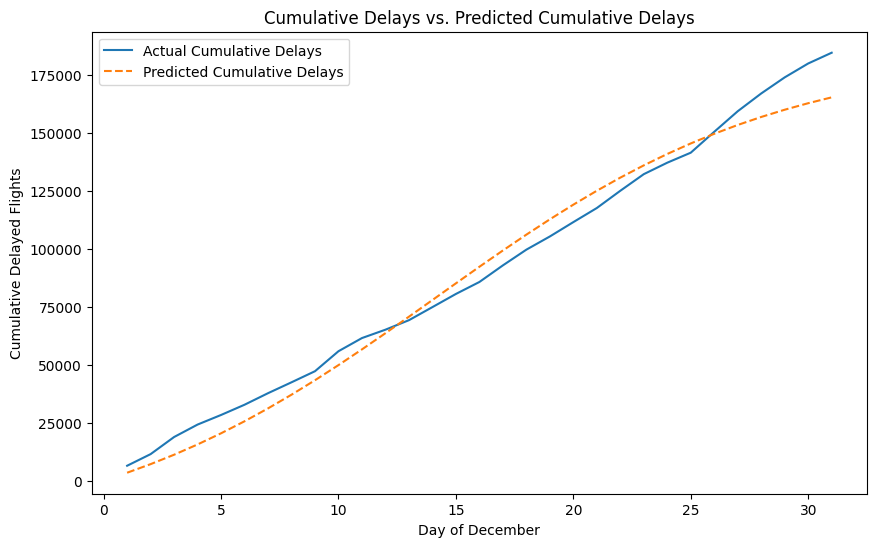

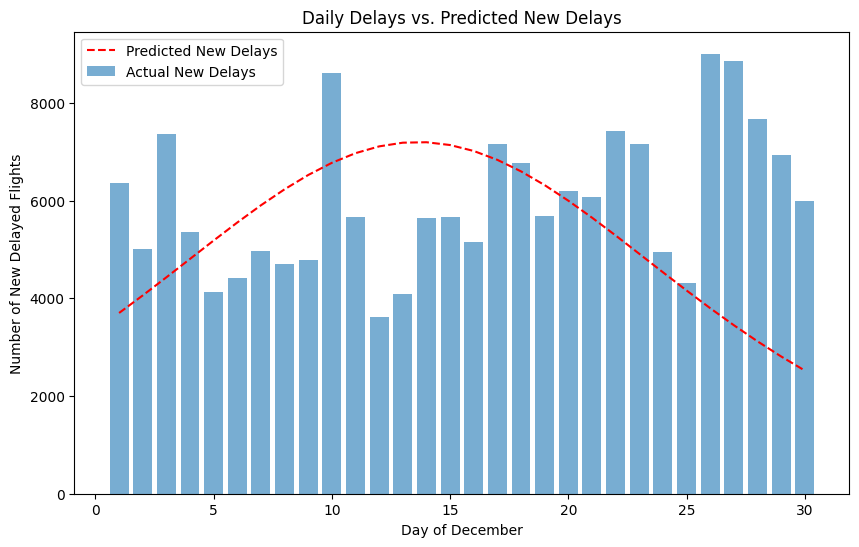

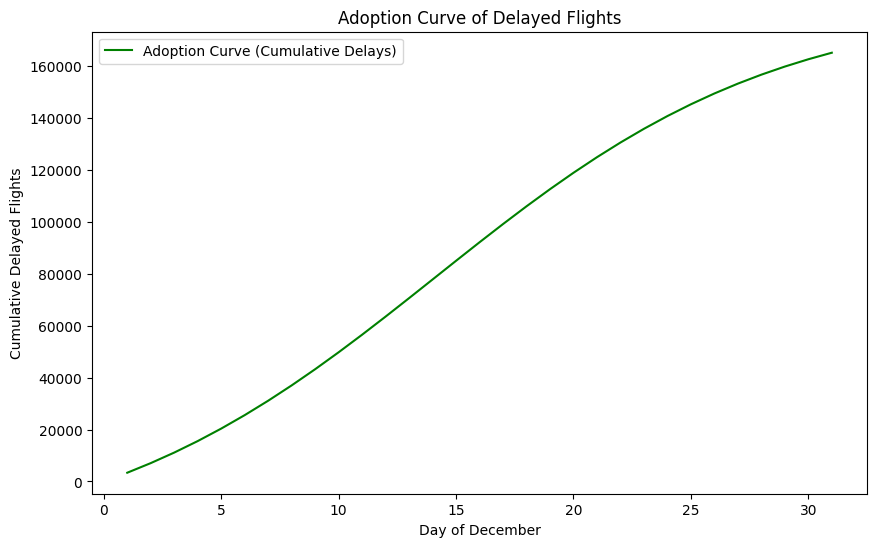

In [ ]:
df = df[df['ARR_DELAY_NEW']>0]
result = df.groupby('DAY_OF_MONTH')['ARR_DELAY_NEW'].count().reset_index(name='Count where ARR_DELAY_NEW > 0')

# Step 1: Calculate the cumulative count of delayed flights
result['Cumulative_Delay'] = result['Count where ARR_DELAY_NEW > 0'].cumsum()

# Step 2: Define the Bass Model function
# The function takes time t, market potential M, innovation coefficient p, and imitation coefficient q
def bass_model(t, M, p, q):
    # Bass model formula for cumulative adoption
    return M * (1 - np.exp(-(p + q) * t)) / (1 + (q / p) * np.exp(-(p + q) * t))

# Step 3: Fit the model
# The curve_fit function will try to fit the bass_model function to the cumulative delay data,
# by finding the best values for M, p, and q
initial_guess = [max(result['Cumulative_Delay']), 0.01, 0.4]  # Initial guesses for M, p, and q
bounds = (0, [max(result['Cumulative_Delay']), 1, 1])  # Bounds for M, p, and q
params, cov = curve_fit(bass_model, result['DAY_OF_MONTH'], result['Cumulative_Delay'], p0=initial_guess, bounds=bounds)

# Extract the estimated parameters
M, p, q = params
print(f'Estimated parameters: Market Potential (M) = {M}, Innovation Coefficient (p) = {p}, Imitation Coefficient (q) = {q}')

# Step 4: Use the model for insights
# Generate a range of days for prediction (e.g., the month of December)
days = np.arange(1, 32)

# Predict the cumulative adoption (delayed flights) for each day
predicted_delays = bass_model(days, M, p, q)

# Calculate new delays per day from cumulative delays
actual_new_delays_per_day = result['Count where ARR_DELAY_NEW > 0']

# Predict new delays per day (derivative of the cumulative Bass model)
predicted_new_delays_per_day = [bass_model(t + 1, M, p, q) - bass_model(t, M, p, q) for t in days[:-1]]

# Plotting Cumulative Delays vs. Predicted Delays
plt.figure(figsize=(10, 6))
plt.plot(result['DAY_OF_MONTH'], result['Cumulative_Delay'], label='Actual Cumulative Delays')
plt.plot(days, predicted_delays, label='Predicted Cumulative Delays', linestyle='--')
plt.title('Cumulative Delays vs. Predicted Cumulative Delays')
plt.xlabel('Day of December')
plt.ylabel('Cumulative Delayed Flights')
plt.legend()
plt.show()

# Plotting Daily Delays vs. Predicted New Delays
plt.figure(figsize=(10, 6))
plt.bar(result['DAY_OF_MONTH'][:-1], actual_new_delays_per_day[:-1], label='Actual New Delays', alpha=0.6)
plt.plot(days[:-1], predicted_new_delays_per_day, label='Predicted New Delays', color='red', linestyle='--')
plt.title('Daily Delays vs. Predicted New Delays')
plt.xlabel('Day of December')
plt.ylabel('Number of New Delayed Flights')
plt.legend()
plt.show()

# Plotting the Adoption Curve
plt.figure(figsize=(10, 6))
plt.plot(days, predicted_delays, label='Adoption Curve (Cumulative Delays)', color='green')
plt.title('Adoption Curve of Delayed Flights')
plt.xlabel('Day of December')
plt.ylabel('Cumulative Delayed Flights')
plt.legend()
plt.show()


Plots Explanations-
1. **Cumulative Delays vs. Predicted Delays:** The graph compares actual cumulative flight delays to those predicted by the Bass model over the days of December. The actual data shows a consistent upward trend with a slightly steeper slope than the predicted values, suggesting that real-world delays accumulated at a faster rate than the model anticipated, especially towards the end of the month.

2. **Daily Delays vs. Predicted New Delays:** This bar and line graph contrast the actual daily new flight delays against the predicted new delays derived from the Bass model. The predicted values follow a bell-shaped curve, typical of the Bass model, peaking and then declining. The actual delays, while following a broadly similar pattern, exhibit more variability and do not decline as predictably, indicating possible external influences on delays not captured by the model.

3. Adoption Curve: The adoption curve depicts the Bass model's characteristic S-shaped cumulative growth curve of delayed flights. The smooth and continuous rise reflects the model's prediction of delay propagation, with a gradual start, accelerating in the middle period, and then tapering off as it approaches the market potential, indicating that delays could be becoming more manageable as the month progresses.


* In our analysis of delayed domestic US flights for December 2023, we've applied the Bass model to understand how flight delays accumulate over time. The Bass model, which is commonly used to forecast the adoption of new technologies, can also be applied to situations like flight delays to predict the spread over a period.

* From our dataset, we estimated the market potential (M) for delays to be approximately 184,395 flights. This suggests that if the trends observed in December continue, we could expect that many flights to encounter delays until the factors causing delays are resolved or mitigated.

* The innovation coefficient (p), estimated at about 0.0173, indicates that a small percentage of flight delays occur independently of other flights' delay statuses, perhaps due to unique circumstances such as mechanical failures or crew availability.

* The imitation coefficient (q), on the other hand, is significantly higher at approximately 0.1191, pointing to a strong influence from the number of flights already delayed. This could be interpreted as delays having a cascading effect, where one delay leads to another, possibly due to factors such as air traffic congestion or scheduling issues.

* **The ratio of ( q/p ) is notably high, reinforcing the idea that most delays are not occurring in isolation but are significantly influenced by the accumulation of previous delays.**

**In conclusion, addressing the research questions, we can infer that the network's structure—particularly the centrality of specific airports—plays a crucial role in delay propagation.** Airports serving as central nodes significantly impact the network's delay patterns, acting as pivotal points where delays can either originate or get amplified. Furthermore, the identification of critical routes and potential bottlenecks allows for strategic planning to enhance network resilience and efficiency. By understanding these delay propagation mechanisms, stakeholders can develop more robust strategies for infrastructure development, operational planning, and creating dynamic models for flight delay insurance, ultimately aiming to improve the passenger experience and operational reliability.

# **Linear Regression For The Network:**
Further to the research question Whether and how does the network structure—particularly the centrality of airports within this network—affect flight delay patterns? And is it possible to forecast the cascading effect of delays across the network? And Is it feasible to generate an annual profit of over 5 million dollars from flight delay insurance? We will try to build a prediction model that uses the centrality indices as explanatory variables.

First, we will define the network that will serve as the foundation for building our model:<br>
**Nodes:** Airports serve as junctions within the network.<br>
**Edges:** Each edge represents a distinct route between two airports.<br>
The network is **directional**, indicating the flow of traffic between airports.

In [ ]:
data = df[['ORIGIN','DEST','ARR_DELAY_NEW']]
data = data.dropna()

G = nx.from_pandas_edgelist(data, 'ORIGIN', 'DEST', create_using=nx.DiGraph())

We aim to investigate the impact of network characteristics on predicting flight delays. Leveraging a comprehensive dataset, we constructed a directed graph where airports act as nodes and the flights between them are depicted as edges. By computing various network centrality measures such as degree centrality, closeness centrality, betweenness centrality, and clustering coefficient for each airport, our objective is to uncover potential relationships between these network metrics and the duration of flight delays. Now we will integrate these centrality indices into a linear regression model to analyze their predictive power and understand their influence on flight delay durations.

In [ ]:
degree_centrality = nx.degree_centrality(G)
closeness_centrality = nx.closeness_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
clustering_coefficient = nx.clustering(G)

# Add network metrics to the dataframe
data['origin_degree_centrality'] = data['ORIGIN'].apply(lambda x: degree_centrality.get(x))
data['destination_degree_centrality'] = data['DEST'].apply(lambda x: degree_centrality.get(x))
data['origin_closeness_centrality'] = data['ORIGIN'].apply(lambda x: closeness_centrality.get(x))
data['destination_closeness_centrality'] = data['DEST'].apply(lambda x: closeness_centrality.get(x))
data['origin_betweenness_centrality'] = data['ORIGIN'].apply(lambda x: betweenness_centrality.get(x))
data['destination_betweenness_centrality'] = data['DEST'].apply(lambda x: betweenness_centrality.get(x))
data['origin_clustering_coefficient'] = data['ORIGIN'].apply(lambda x: clustering_coefficient.get(x))
data['destination_clustering_coefficient'] = data['DEST'].apply(lambda x: clustering_coefficient.get(x))

# Encode categorical variables (airport codes)
label_encoder = LabelEncoder()
data['ORIGIN'] = label_encoder.fit_transform(data['ORIGIN'])
data['DEST'] = label_encoder.fit_transform(data['DEST'])

# Split the dataset into features and target variable
X = data[['origin_degree_centrality', 'destination_degree_centrality', 'origin_closeness_centrality', 'destination_closeness_centrality', 'origin_betweenness_centrality', 'destination_betweenness_centrality', 'origin_clustering_coefficient', 'destination_clustering_coefficient']]
y = data['ARR_DELAY_NEW']

# Add a constant to the model (intercept)
X = sm.add_constant(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the model using statsmodels to get detailed results
model = sm.OLS(y_train, X_train)
results = model.fit()

# Print out the statistics
print(results.summary())

# Predict using the linear model
y_pred = results.predict(X_test)

# Calculate and print the mean squared error
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

                            OLS Regression Results                            
Dep. Variable:          ARR_DELAY_NEW   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     45.68
Date:                Wed, 13 Mar 2024   Prob (F-statistic):           4.85e-74
Time:                        13:26:46   Log-Likelihood:            -2.5388e+06
No. Observations:              482000   AIC:                         5.078e+06
Df Residuals:                  481991   BIC:                         5.078e+06
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

* **R-squared (0.001):** This value is very low, indicating that the model explains only 0.1% of the variance in flight delay times. It suggests that while the network characteristics have a statistically significant relationship with flight delays, they only provide a minimal amount of explanatory power in predicting delays.

* **F-statistic (45.68):** The F-statistic is statistically significant (Prob < 0.05), indicating that the model is statistically significant at the group level, meaning there is some relationship between the predictors and the response variable.

#### **Variable-Specific Analysis:**
* **Origin Degree Centrality (coef: 2.1424, p-value: 0.128):** This variable shows a positive coefficient but is not statistically significant (p > 0.05), suggesting that the number of connections at the origin airport has a limited impact on delay times, at least within this dataset.

* **Destination Degree Centrality (coef: 6.5038, p-value: < 0.001):** This variable is significant and positive, indicating that flights to more connected (higher degree centrality) destination airports are associated with longer delays.

* **Origin Closeness Centrality (coef: -30.3148, p-value: < 0.001):** The negative and significant coefficient suggests that flights originating from airports more central (in terms of closeness centrality) in the network tend to have shorter delays.

* **Destination Closeness Centrality (coef: -25.2099, p-value: < 0.001):** Similar to the origin's closeness centrality, a more centrally located destination airport in the network correlates with shorter delays.

* **Origin Betweenness Centrality (coef: 2.3615, p-value: 0.419):** This metric is not significant, indicating that the airport's role as an intermediary (betweenness centrality) at the origin doesn't have a clear impact on delay times in this model.

* **Destination Betweenness Centrality (coef: -19.4746, p-value: < 0.001):** Significantly negative, suggesting that airports serving as critical transfer points (high betweenness centrality) at the destination are associated with shorter delays.

* **Origin Clustering Coefficient (coef: -1.4049, p-value: 0.011):** This is significant and negative, indicating that flights from more clustered (interconnected) origin airports tend to have shorter delays.

* **Destination Clustering Coefficient (coef: -0.8135, p-value: 0.139):** Though negative, it's not statistically significant, suggesting that the interconnectedness of airports at the destination has an unclear impact on delays.

#### **Model Diagnostics:**
* **Omnibus/Prob(Omnibus):** The test suggests the residuals are not normally distributed.
* **Skewness and Kurtosis:** Indicate significant deviations from normality.
Durbin-Watson: Close to 2, suggesting no significant autocorrelation in the residuals.
* **Condition Number:** Indicates potential multicollinearity, which might be influencing the reliability of the estimated coefficients.
* **Mean Squared Error (1965.0255):** Represents the average of the squares of the errors between predicted and actual delay times. The square root of MSE gives an average error in minutes, providing a tangible measure of model accuracy.

In summary, while certain network characteristics show a significant relationship with flight delays, the overall model has limited predictive power. This suggests that while the network structure has some influence, many other factors contribute to flight delays that are not captured in this model. For a more robust predictive model, including additional variables and potentially using more sophisticated modeling techniques could be beneficial.<br>
<br>



#### **Optimizing Predictive Model Performance Through Exhaustive Variable Combination Search:**

We aim to identify the optimal combination of variables that yield the most effective predictive model. To achieve this, we will explore all possible combinations of variables ranging from 1 to 8. By systematically evaluating each combination, we will determine which subset of variables produces the model with the highest predictive performance. This exhaustive search process will allow us to thoroughly assess the impact of different variable combinations on the model's accuracy and identify the most influential factors contributing to our predictive outcome.


In [ ]:
# Define a function to fit a model and get the R-squared value
def evaluate_model(features):
    X = sm.add_constant(data[features])
    y = data['ARR_DELAY_NEW']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    model = sm.OLS(y_train, X_train).fit()
    print("Model features:",features," ,R squared:",model.rsquared,)
    return model.rsquared, model

# List of all features
all_features = [
    'origin_degree_centrality',
    'destination_degree_centrality',
    'origin_closeness_centrality',
    'destination_closeness_centrality',
    'origin_betweenness_centrality',
    'destination_betweenness_centrality',
    'origin_clustering_coefficient',
    'destination_clustering_coefficient'
]

# Track the best combination
best_r_squared = 0
best_combination = None
best_model = None

# Iterate over all possible combinations of features
for L in range(1, len(all_features) + 1):
    for subset in itertools.combinations(all_features, L):
        r_squared, model = evaluate_model(list(subset))
        if r_squared > best_r_squared:
            best_r_squared = r_squared
            best_combination = subset
            best_model = model

Model features: ['origin_degree_centrality']  ,R squared: 0.00025763683029611517
Model features: ['destination_degree_centrality']  ,R squared: 1.6058683121156214e-05
Model features: ['origin_closeness_centrality']  ,R squared: 0.0003844288627341541
Model features: ['destination_closeness_centrality']  ,R squared: 5.182904759815088e-05
Model features: ['origin_betweenness_centrality']  ,R squared: 0.00015665129424735635
Model features: ['destination_betweenness_centrality']  ,R squared: 5.2655279380697806e-05
Model features: ['origin_clustering_coefficient']  ,R squared: 7.556241655692908e-05
Model features: ['destination_clustering_coefficient']  ,R squared: 6.551514012631543e-06
Model features: ['origin_degree_centrality', 'destination_degree_centrality']  ,R squared: 0.00036560552808750924
Model features: ['origin_degree_centrality', 'origin_closeness_centrality']  ,R squared: 0.00046738142170588137
Model features: ['origin_degree_centrality', 'destination_closeness_centrality']  ,R

#### **Best Combination Model Results:**

In [ ]:
# Print the best combination and its R-squared value
print("Best combination:", best_combination)
print("Best R-squared:", best_r_squared)

# Optionally, print the summary of the best model
print(best_model.summary())

Best combination: ('origin_degree_centrality', 'destination_degree_centrality', 'origin_closeness_centrality', 'destination_closeness_centrality', 'origin_betweenness_centrality', 'destination_betweenness_centrality', 'origin_clustering_coefficient', 'destination_clustering_coefficient')
Best R-squared: 0.0007576474541424183
                            OLS Regression Results                            
Dep. Variable:          ARR_DELAY_NEW   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     45.68
Date:                Wed, 13 Mar 2024   Prob (F-statistic):           4.85e-74
Time:                        13:36:38   Log-Likelihood:            -2.5388e+06
No. Observations:              482000   AIC:                         5.078e+06
Df Residuals:                  481991   BIC:                         5.078e+06
Df Model:                           8    

Despite exploring various combinations of variables, the model that includes all variables continues to outperform others.
#### **Enhancing Predictive Power Through Temporal Factors in Flight Delay Analysis**

Considering flight delays, factors such as the day of the week and time are likely to be significant predictors due to potential variations in traffic and congestion levels during busier periods. Therefore, we intend to enhance the predictive power of our model by incorporating the day of the week and time (excluding minutes) alongside the previously identified influential variables. This expanded model aims to capture additional temporal patterns and variations, thereby providing a more comprehensive understanding of the factors influencing flight delay durations.

In [ ]:
data = df[['ORIGIN','DEST','ARR_DELAY_NEW','CRS_DEP_HOUR','DAY_OF_WEEK']]

data = data.dropna()

degree_centrality = nx.degree_centrality(G)
closeness_centrality = nx.closeness_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
clustering_coefficient = nx.clustering(G)

# Add network metrics to the dataframe
data['origin_degree_centrality'] = data['ORIGIN'].apply(lambda x: degree_centrality.get(x))
data['destination_degree_centrality'] = data['DEST'].apply(lambda x: degree_centrality.get(x))
data['origin_closeness_centrality'] = data['ORIGIN'].apply(lambda x: closeness_centrality.get(x))
data['destination_closeness_centrality'] = data['DEST'].apply(lambda x: closeness_centrality.get(x))
data['origin_betweenness_centrality'] = data['ORIGIN'].apply(lambda x: betweenness_centrality.get(x))
data['destination_betweenness_centrality'] = data['DEST'].apply(lambda x: betweenness_centrality.get(x))
data['origin_clustering_coefficient'] = data['ORIGIN'].apply(lambda x: clustering_coefficient.get(x))
data['destination_clustering_coefficient'] = data['DEST'].apply(lambda x: clustering_coefficient.get(x))

# List of all features
all_features = [
    'origin_degree_centrality',
    'destination_degree_centrality',
    'origin_closeness_centrality',
    'destination_closeness_centrality',
    'origin_betweenness_centrality',
    'destination_betweenness_centrality',
    'origin_clustering_coefficient',
    'destination_clustering_coefficient',
    'DAY_OF_WEEK',
    'CRS_DEP_HOUR'
]

# Track the best combination
best_r_squared = 0
best_combination = None
best_model = None

# Iterate over all possible combinations of features
for L in range(1, len(all_features) + 1):
    for subset in itertools.combinations(all_features, L):
        r_squared, model = evaluate_model(list(subset))
        if r_squared > best_r_squared:
            best_r_squared = r_squared
            best_combination = subset
            best_model = model

Model features: ['origin_degree_centrality']  ,R squared: 0.00025763683029611517
Model features: ['destination_degree_centrality']  ,R squared: 1.6058683121156214e-05
Model features: ['origin_closeness_centrality']  ,R squared: 0.0003844288627341541
Model features: ['destination_closeness_centrality']  ,R squared: 5.182904759815088e-05
Model features: ['origin_betweenness_centrality']  ,R squared: 0.00015665129424735635
Model features: ['destination_betweenness_centrality']  ,R squared: 5.2655279380697806e-05
Model features: ['origin_clustering_coefficient']  ,R squared: 7.556241655692908e-05
Model features: ['destination_clustering_coefficient']  ,R squared: 6.551514012631543e-06
Model features: ['DAY_OF_WEEK']  ,R squared: 0.0003521750264465773
Model features: ['CRS_DEP_HOUR']  ,R squared: 0.0019442467434566124
Model features: ['origin_degree_centrality', 'destination_degree_centrality']  ,R squared: 0.00036560552808750924
Model features: ['origin_degree_centrality', 'origin_closenes

In [ ]:
# Print the best combination and its R-squared value
print("Best combination:", best_combination)
print("Best R-squared:", best_r_squared)

# Optionally, print the summary of the best model
print(best_model.summary())

Best combination: ('origin_degree_centrality', 'destination_degree_centrality', 'origin_closeness_centrality', 'destination_closeness_centrality', 'origin_betweenness_centrality', 'destination_betweenness_centrality', 'origin_clustering_coefficient', 'destination_clustering_coefficient', 'DAY_OF_WEEK', 'CRS_DEP_HOUR')
Best R-squared: 0.0032437366359568953
                            OLS Regression Results                            
Dep. Variable:          ARR_DELAY_NEW   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     156.9
Date:                Wed, 13 Mar 2024   Prob (F-statistic):               0.00
Time:                        13:56:06   Log-Likelihood:            -2.5382e+06
No. Observations:              482000   AIC:                         5.077e+06
Df Residuals:                  481989   BIC:                         5.077e+06
Df Model: 

With the inclusion of the DAY_OF_WEEK and CRS_DEP_HOUR variables, our regression model aims to capture temporal factors alongside network characteristics in predicting flight delays. Let's dissect the updated OLS regression results:

* **R-squared (0.003):** The R-squared value has increased slightly to 0.3%, suggesting the model now explains a marginally higher proportion of the variance in flight delay times compared to the previous model without DAY_OF_WEEK and CRS_DEP_HOUR. This increase, although minor, indicates that time-related features contribute additional explanatory power.

* **F-statistic:** The model remains statistically significant, as indicated by the F-statistic and its associated p-value.

#### Variable-Specific Analysis:

* **DAY_OF_WEEK (coef: 0.4517, p-value: < 0.001):** This variable is significant, indicating that the day of the week has a measurable effect on flight delays, with certain days likely experiencing more delays than others.

* **CRS_DEP_HOUR (coef: 0.4497, p-value: < 0.001):** This is also significant, showing that the scheduled departure hour affects delay times, likely reflecting peak vs. off-peak travel times.

#### Comparing these variables to the network characteristics:

* **Network Metrics:** The coefficients and significance levels for the network metrics (origin/destination degree/closeness/betweenness centrality and clustering coefficients) remain largely unchanged. This consistency suggests that the addition of time-related variables does not overshadow the influence of network characteristics on flight delays.
* **Destination Degree Centrality:** Continues to show a strong positive relationship with delays, reinforcing the notion that busier airports tend to have longer delays.
* **Closeness Centrality:** Both origin and destination closeness centrality maintain their negative relationship with delays, suggesting that more central airports in the network experience fewer delays.
* **Betweenness Centrality:** The destination betweenness centrality retains its significant negative coefficient, while the origin betweenness centrality remains non-significant, underscoring the importance of the destination airport's network position.
* **Clustering Coefficients:** Similar to the previous model, the origin clustering coefficient is significant and negative, whereas the destination clustering coefficient's impact is less clear.

#### Diagnostics and Model Fit:

* The diagnostic tests (Omnibus, Jarque-Bera) still indicate non-normality in the residuals, and the condition number suggests potential multicollinearity issues, which could stem from interdependencies between network metrics or between these metrics and the newly added temporal variables.

* Mean Squared Error: This remains an important measure of model performance, indicating the average prediction error in minutes.

In summary, the inclusion of DAY_OF_WEEK and CRS_DEP_HOUR adds valuable temporal context to the model, slightly enhancing its explanatory power. However, the overall R-squared value remains low, suggesting that additional factors not captured by the model significantly influence flight delays. The consistency in the network characteristics' coefficients before and after adding the temporal variables suggests that these network features have a distinct and consistent influence on flight delays, independent of the specific time variables considered.

### **Integrating Airport-Airline Bipartite Network Properties to Enhance Predictive Modeling of Flight Delays**
In our efforts to refine our model, we're looking to incorporate a new network properties from the Airport-Airline Bipartite Network. This network is unique in that it consists of two distinct sets of nodes: airports and airlines. The edges in this bipartite network represent operational flights connecting airlines to airports. This approach may allows us to capture the intricate relationships between airports and the airlines that operate there.

Analyzing this bipartite network may provides us with valuable insights into how the distribution and concentration of airlines at different airports may impact flight delay times. For instance, airports with a high concentration of airlines may experience higher levels of competition and congestion, potentially leading to increased flight delays. Conversely, airports with fewer airlines may have more streamlined operations, resulting in fewer delays.

By incorporating network properties such as degree centrality, closeness centrality, betweenness centrality, and clustering coefficient from this bipartite network into our model, we may can better understand the structural characteristics of the aviation network. These network properties help us quantify the importance, connectivity, and clustering patterns of airports and airlines within the network.

In [ ]:
data = df[['ORIGIN', 'DEST', 'ARR_DELAY_NEW', 'CRS_DEP_HOUR', 'DAY_OF_WEEK', 'OP_CARRIER_AIRLINE_ID']]
data = data.dropna()

B = nx.Graph()

B.add_nodes_from(data['ORIGIN'].unique(), bipartite=0)  # Airport nodes
B.add_nodes_from(data['OP_CARRIER_AIRLINE_ID'].unique(), bipartite=1)  # Airline nodes
for index, row in data.iterrows():
    B.add_edge(row['OP_CARRIER_AIRLINE_ID'], row['ORIGIN'])

airports = [node for node in B.nodes if B.nodes[node]['bipartite'] == 0]
airlines = [node for node in B.nodes if B.nodes[node]['bipartite'] == 1]

print("Number of airports:", len(airports))
print("Number of airlines:", len(airlines))
print("Number of edges:", B.number_of_edges())

Number of airports: 351
Number of airlines: 21
Number of edges: 1870


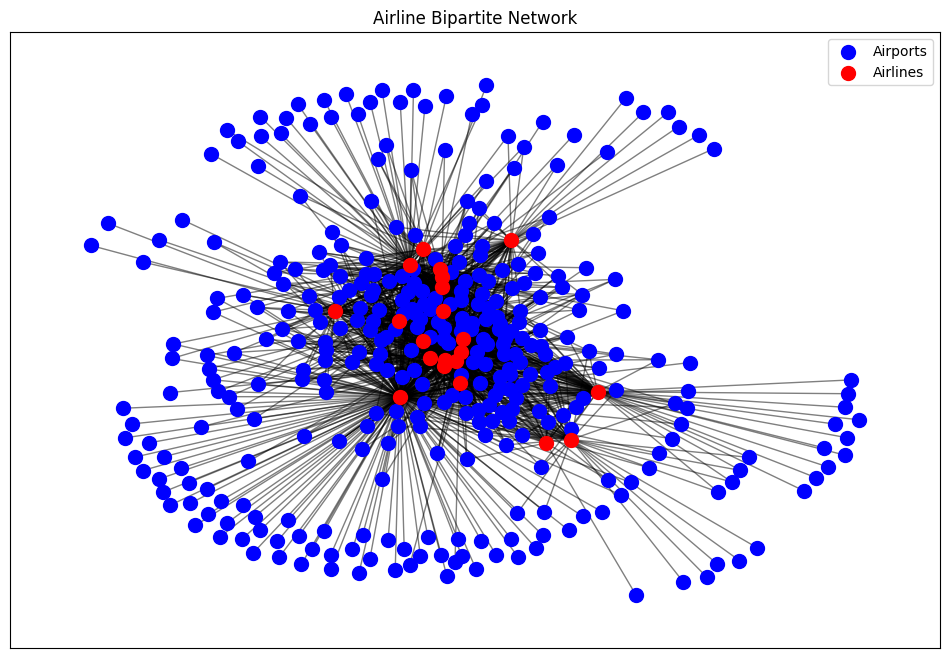

In [ ]:
airport_color = 'blue'
airline_color = 'red'

plt.figure(figsize=(12, 8))
pos = nx.spring_layout(B)
nx.draw_networkx_nodes(B, pos, nodelist=airports, node_color=airport_color, node_size=100, label='Airports')
nx.draw_networkx_nodes(B, pos, nodelist=airlines, node_color=airline_color, node_size=100, label='Airlines')
nx.draw_networkx_edges(B, pos, alpha=0.5)

plt.legend()

plt.title('Airline Bipartite Network')
plt.show()

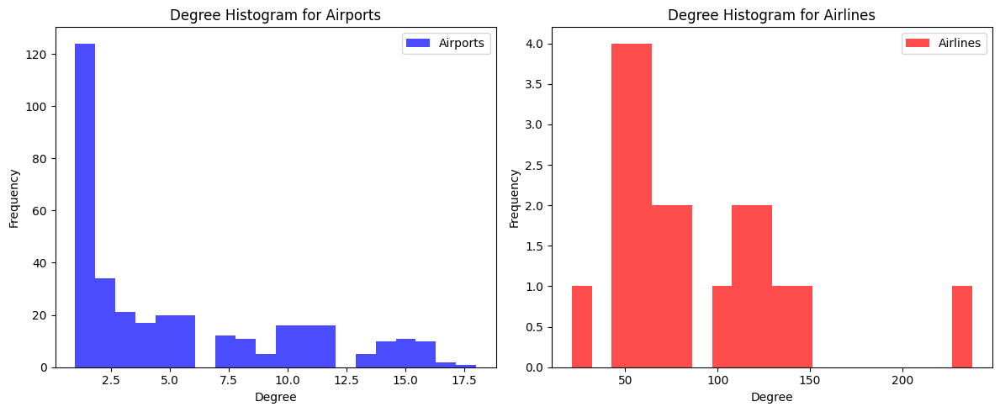

In [ ]:
# Calculate degrees for airport and airline nodes separately
airport_degrees = [B.degree(node) for node in airports]
airline_degrees = [B.degree(node) for node in airlines]

# Create a figure and two subplots side by side
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Plot degree histogram for airports
axs[0].hist(airport_degrees, bins=20, color='blue', alpha=0.7, label='Airports')
axs[0].set_xlabel('Degree')
axs[0].set_ylabel('Frequency')
axs[0].set_title('Degree Histogram for Airports')
axs[0].legend()

# Plot degree histogram for airlines
axs[1].hist(airline_degrees, bins=20, color='red', alpha=0.7, label='Airlines')
axs[1].set_xlabel('Degree')
axs[1].set_ylabel('Frequency')
axs[1].set_title('Degree Histogram for Airlines')
axs[1].legend()

# Adjust layout
plt.tight_layout()

# Show plots
plt.show()


In [ ]:
degree_centrality = nx.degree_centrality(B)

airline_degree_centrality = {node: centrality for node, centrality in degree_centrality.items() if node in airlines}

degree_centrality_mean = np.mean(list(airline_degree_centrality.values()))
degree_centrality_max = max(airline_degree_centrality.values())
degree_centrality_min = min(airline_degree_centrality.values())

print("Degree Centrality:")
print("Mean:", degree_centrality_mean)
print("Max:", degree_centrality_max)
print("Min:", degree_centrality_min)

closeness_centrality = nx.closeness_centrality(B)

airline_closeness_centrality = {node: centrality for node, centrality in closeness_centrality.items() if node in airlines}

closeness_centrality_mean = np.mean(list(airline_closeness_centrality.values()))
closeness_centrality_max = max(airline_closeness_centrality.values())
closeness_centrality_min = min(airline_closeness_centrality.values())
print("")
print("Closeness Centrality:")
print("Mean:", closeness_centrality_mean)
print("Max:", closeness_centrality_max)
print("Min:", closeness_centrality_min)

betweenness_centrality = nx.betweenness_centrality(B)

airline_betweenness_centrality = {node: centrality for node, centrality in betweenness_centrality.items() if node in airlines}

betweenness_centrality_mean = np.mean(list(airline_betweenness_centrality.values()))
betweenness_centrality_max = max(airline_betweenness_centrality.values())
betweenness_centrality_min = min(airline_betweenness_centrality.values())
print("")
print("Betweenness Centrality:")
print("Mean:", betweenness_centrality_mean)
print("Max:", betweenness_centrality_max)
print("Min:", betweenness_centrality_min)

Degree Centrality:
Mean: 0.24002053651649338
Max: 0.6415094339622642
Min: 0.05660377358490566

Closeness Centrality:
Mean: 0.40974118285059985
Max: 0.6012965964343598
Min: 0.3470533208606174

Betweenness Centrality:
Mean: 0.06068748764166551
Max: 0.4614482984999305
Min: 0.006825844855957665


* Degree centrality measures the number of connections a node has in the network. The mean degree centrality for airlines is 0.240, indicating that, on average, each airline node is connected to approximately 24% of the other nodes in the network. The maximum degree centrality is relatively high (0.642), suggesting that some airlines have a significant number of connections compared to others. The minimum degree centrality is low (0.057), indicating that there are airlines with fewer connections.

* Closeness centrality measures how close a node is to all other nodes in the network. The mean closeness centrality for airlines is 0.410, indicating that, on average, airline nodes are relatively close to other nodes in the network. The maximum closeness centrality (0.601) suggests that some airlines are closer to all other nodes compared to others. The minimum closeness centrality (0.347) is not too low, indicating that even the least connected airlines are not too distant from the rest of the network.

* Betweenness centrality measures the extent to which a node lies on the shortest paths between other nodes in the network. The mean betweenness centrality for airlines is 0.061, indicating that, on average, airlines do not act as intermediaries in many shortest paths between other nodes. The maximum betweenness centrality (0.461) is relatively high, suggesting that some airlines play a significant role in connecting other nodes in the network. The minimum betweenness centrality (0.007) is low, indicating that most airlines have minimal influence on shortest paths.

In [ ]:
data = df[['ORIGIN', 'DEST', 'ARR_DELAY_NEW', 'CRS_DEP_HOUR', 'DAY_OF_WEEK', 'OP_CARRIER_AIRLINE_ID']]
data = data.dropna()

# Create the original airport network
G = nx.from_pandas_edgelist(data, 'ORIGIN', 'DEST', create_using=nx.DiGraph())

# Compute network metrics for the airport network
degree_centrality = nx.degree_centrality(G)
closeness_centrality = nx.closeness_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
clustering_coefficient = nx.clustering(G)

# Add airport network metrics to the dataframe
data['origin_degree_centrality'] = data['ORIGIN'].apply(lambda x: degree_centrality.get(x))
data['destination_degree_centrality'] = data['DEST'].apply(lambda x: degree_centrality.get(x))
data['origin_closeness_centrality'] = data['ORIGIN'].apply(lambda x: closeness_centrality.get(x))
data['destination_closeness_centrality'] = data['DEST'].apply(lambda x: closeness_centrality.get(x))
data['origin_betweenness_centrality'] = data['ORIGIN'].apply(lambda x: betweenness_centrality.get(x))
data['destination_betweenness_centrality'] = data['DEST'].apply(lambda x: betweenness_centrality.get(x))
data['origin_clustering_coefficient'] = data['ORIGIN'].apply(lambda x: clustering_coefficient.get(x))
data['destination_clustering_coefficient'] = data['DEST'].apply(lambda x: clustering_coefficient.get(x))

# Create the Airport-Airline Bipartite Network
B = nx.Graph()
# Add nodes and edges
B.add_nodes_from(data['ORIGIN'].unique(), bipartite=0)  # Airport nodes
B.add_nodes_from(data['OP_CARRIER_AIRLINE_ID'].unique(), bipartite=1)  # Airline nodes
for index, row in data.iterrows():
    B.add_edge(row['OP_CARRIER_AIRLINE_ID'], row['ORIGIN'])

# Compute network metrics for the bipartite graph (focusing on airlines)
airline_degree_centrality = nx.degree_centrality(B)
airline_closeness_centrality = nx.closeness_centrality(B)
airline_betweenness_centrality = nx.betweenness_centrality(B)
airline_clustering_coefficient = nx.clustering(B)


# Add airline network metric to the dataframe
data['airline_degree_centrality'] = data['OP_CARRIER_AIRLINE_ID'].apply(lambda x: airline_degree_centrality.get(x))
data['airline_closeness_centrality'] = data['OP_CARRIER_AIRLINE_ID'].apply(lambda x: airline_closeness_centrality.get(x))
data['airline_betweenness_centrality'] = data['OP_CARRIER_AIRLINE_ID'].apply(lambda x: airline_betweenness_centrality.get(x))
data['airline_clustering_coefficient'] = data['OP_CARRIER_AIRLINE_ID'].apply(lambda x: airline_clustering_coefficient.get(x))


# Encode categorical variables
label_encoder = LabelEncoder()
data['ORIGIN'] = label_encoder.fit_transform(data['ORIGIN'])
data['DEST'] = label_encoder.fit_transform(data['DEST'])

# Define the feature set to include both airport and airline network metrics
all_features = [
    'origin_degree_centrality', 'destination_degree_centrality',
    'origin_closeness_centrality', 'destination_closeness_centrality',
    'origin_betweenness_centrality', 'destination_betweenness_centrality',
    'origin_clustering_coefficient', 'destination_clustering_coefficient',
    'airline_degree_centrality', 'airline_closeness_centrality','airline_betweenness_centrality',
    'airline_clustering_coefficient','DAY_OF_WEEK', 'CRS_DEP_HOUR'
]

# Track the best model
best_r_squared = 0
best_combination = None
best_model = None

# Evaluate models for all combinations of features
for L in range(1, len(all_features) + 1):
    for subset in itertools.combinations(all_features, L):
        r_squared, model = evaluate_model(list(subset))
        if r_squared > best_r_squared:
            best_r_squared = r_squared
            best_combination = subset
            best_model = model

Streaming output truncated to the last 5000 lines.
Model features: ['origin_degree_centrality', 'destination_closeness_centrality', 'origin_betweenness_centrality', 'origin_clustering_coefficient', 'airline_degree_centrality', 'airline_closeness_centrality', 'airline_betweenness_centrality', 'airline_clustering_coefficient']  ,R squared: 0.0016705178568151569
Model features: ['origin_degree_centrality', 'destination_closeness_centrality', 'origin_betweenness_centrality', 'origin_clustering_coefficient', 'airline_degree_centrality', 'airline_closeness_centrality', 'airline_betweenness_centrality', 'DAY_OF_WEEK']  ,R squared: 0.0020133337775373183
Model features: ['origin_degree_centrality', 'destination_closeness_centrality', 'origin_betweenness_centrality', 'origin_clustering_coefficient', 'airline_degree_centrality', 'airline_closeness_centrality', 'airline_betweenness_centrality', 'CRS_DEP_HOUR']  ,R squared: 0.003731202092715158
Model features: ['origin_degree_centrality', 'destinat

In [ ]:
# Print the best combination and its R-squared value
print("Best combination:", best_combination)
print("Best R-squared:", best_r_squared)

print(best_model.summary())

Best combination: ('origin_degree_centrality', 'destination_degree_centrality', 'origin_closeness_centrality', 'destination_closeness_centrality', 'origin_betweenness_centrality', 'destination_betweenness_centrality', 'origin_clustering_coefficient', 'destination_clustering_coefficient', 'airline_degree_centrality', 'airline_closeness_centrality', 'airline_betweenness_centrality', 'DAY_OF_WEEK', 'CRS_DEP_HOUR')
Best R-squared: 0.004494961778838791
                            OLS Regression Results                            
Dep. Variable:          ARR_DELAY_NEW   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     167.4
Date:                Mon, 18 Mar 2024   Prob (F-statistic):               0.00
Time:                        08:54:03   Log-Likelihood:            -2.5379e+06
No. Observations:              482000   AIC:                         5.076

The integration of Airport-Airline Bipartite Network properties into the predictive modeling of flight delays has produced a model with an R-squared of 0.004, indicating that the model explains 0.4% of the variance in flight delay times. This value, while low, marks a slight improvement over previous iterations, suggesting that the inclusion of bipartite network characteristics has marginally enhanced the model’s predictive capabilities.

Network Characteristics Impact: The airline_closeness_centrality has a substantial positive coefficient (239.0713), indicating that airlines that are more central to the network tend to be associated with longer delays.
Conversely, the airline_degree_centrality has a large negative coefficient (-101.9744), which suggests that airlines with more connections might have more robust operations and thus experience shorter delays, although this could also indicate less direct influence or a potential data anomaly.
Destination_degree_centrality is positive (10.8676), reinforcing the idea that flights to more connected airports tend to experience longer delays.
Destination_betweenness_centrality is notably negative (-27.9620), implying that key intermediary airports in the network might be associated with shorter delays at the destination.

Temporal Factors: Both DAY_OF_WEEK and CRS_DEP_HOUR are significant, which underscores the influence of temporal patterns on flight delays. This aligns with the expectation that congestion varies by time and day, affecting delay times.
Model Diagnostics:

The Prob (Omnibus) and the Jarque-Bera (JB) test both indicate that the residuals are not normally distributed, which can impact the model's predictions.
The Durbin-Watson statistic is approximately 2, which suggests that there is no significant autocorrelation in the residuals.
The condition number is quite high (5.55e+03), indicating potential multicollinearity problems that could affect the reliability of the regression coefficients.
Predictive Performance:

The slight increase in the R-squared value after incorporating the bipartite network characteristics suggests that these aspects of the network structure do have an impact on delays, although it’s clear that other unmodeled factors are also influencing delay times.
Despite the exhaustive search for the best combination of variables, the overall explanatory power of the model remains limited, suggesting that the complexity of flight delays is not fully captured by network centrality measures and temporal factors alone.
In summary, the model establishes a relationship between network centrality and flight delays, yet the predictive power is relatively low, pointing to the multifaceted nature of delay causation. The results highlight the potential value of integrating bipartite network properties into predictive models while also indicating a need for broader variables, perhaps related to weather, air traffic control, and specific airline operational characteristics, to more accurately forecast delays and inform the profitability of flight delay insurance products.

<br>
<br>
The linear regression analysis incorporating network centrality measures has shed light on the connection between the network structure of the US domestic airline network and the occurrence of flight delays. High degree centrality in airports correlates with an increased number of delays, possibly due to higher traffic and the resulting congestion. Conversely, airports with higher closeness centrality are associated with fewer delays, indicative of their effective placement in the network that promotes efficient travel.

Destinations with significant betweenness centrality exhibit fewer delays, signifying that airports which are pivotal for connecting different parts of the network are likely adept at managing traffic flow. This supports the theory that an airport's strategic importance and position within the network are instrumental in influencing its susceptibility to delays.

Despite these findings, the low R-squared values from the regression models point to a multifaceted nature of flight delays where network structure is just one piece of the puzzle. It's clear that the centrality measures, while helpful, are insufficient alone to account for the variability in delays. This underscores the presence of additional influential factors that contribute to delays, ranging from operational strategies and airline-specific practices to unpredictable elements like weather and airspace restrictions.

The current models' capability in forecasting the cascading effects of delays is similarly constrained, emphasizing the need for a dynamic approach to capture the complex interactions over time. Static network metrics offer insights into the potential for delays but cannot capture the actual progression of delays throughout the network.

In conclusion, while network centrality measures are useful indicators and correlate with delay patterns, enhancing the predictive power of delay models necessitates the inclusion of further variables. To increase the explanatory power (R-squared) of the models, additional research should integrate a broader spectrum of predictive factors, including temporal and operational variables, and potentially leverage more complex, dynamic analytical methods. This expanded approach will not only offer a more comprehensive understanding of the factors driving flight delays but will also provide stronger predictive capabilities essential for applications such as flight delay insurance products.



## **Pricing Model**
Compensation to the customer for each minute of delay \$3.50



In [ ]:
best_combination = ['origin_degree_centrality', 'destination_degree_centrality', 'origin_closeness_centrality', 'destination_closeness_centrality', 'origin_betweenness_centrality', 'destination_betweenness_centrality', 'origin_clustering_coefficient', 'destination_clustering_coefficient', 'airline_degree_centrality', 'airline_closeness_centrality', 'airline_betweenness_centrality', 'DAY_OF_WEEK', 'CRS_DEP_HOUR']

# Add constant term to the data
data_with_const = sm.add_constant(data[best_combination])

# Make predictions using the best model
data['predicted_arrival_delay'] = best_model.predict(data_with_const)

# Compute the absolute error
data['absolute_error'] = abs(data['ARR_DELAY_NEW'] - data['predicted_arrival_delay'])

# Calculate the average error
average_error = data['absolute_error'].mean()
print("Average error in minutes:", average_error)


Average error in minutes: 29.73084343370554


In [ ]:
# Filter out observations with zero observed delay
data_filtered = data[data['ARR_DELAY_NEW'] != 0]

# Calculate the ratio of absolute error to observed delay
data_filtered['error_ratio'] = data_filtered['absolute_error'] / data_filtered['ARR_DELAY_NEW']

# Calculate the average error ratio
average_error_ratio = data_filtered['error_ratio'].mean()
print("Average times the error is on average:", average_error_ratio)

Average times the error is on average: 1.438871246952348


#### **Insurence Price= (Prediction_for_flight_delay * 1.5 + 3.5\$) + 15\$**

Prediction for flight delay: This variable represents the estimated delay time for a flight, in minutes. It is the output of a predictive model that takes into account various factors such as airline company, airport congestion, and historical flight performance data. The accuracy of this prediction is crucial, as it directly influences the pricing of the insurance premium. <br>
Scaling factor (1.5): After evaluating the model errors on the predictions for delay time and calculating the average error(0.45), a 5% margin is added. This factor is used to adjust the predicted delay time to account for uncertainties and variations in the prediction. It acts as a buffer to ensure that the premium covers the risk of underestimating the delay. A higher scaling factor increases the premium, providing a larger safety margin for the insurer. <br>
Multiplier (3.5): This value is used to convert the adjusted delay time into a monetary amount that represents the cost of the delay to the passenger. This multiplier ensures that the premium is proportional to the potential impact of the delay.<br>
Fixed base cost ($15): The fixed base cost of $15 is a constant amount that is added to every insurance premium. This ensures that the insurer generates a minimum revenue per policy, helping to maintain the financial stability of the insurance business.

# **Estimating Market Size**
The market size analysis for flight delay insurance in the U.S. aims to provide an insightful overview based on the number of air passengers and the propensity of travelers to purchase travel insurance, with a focus on flight delay coverage.

### **Estimating market size by our manual analysis**
Air Passenger Growth Assumption: In 2023, U.S. airlines carried approximately 751.4 million passengers on domestic flights. Projecting into 2024, we anticipate a 5% increase in passenger numbers, reflecting a rebound in the travel industry, increased consumer confidence, and airline capacity expansion. This results in an estimated 789 million air passengers in 2024.

Travel Insurance Purchase Trends: Data indicates that 38% of travelers purchased some form of travel insurance. Within this segment, 13% opted for cancellation insurance, 11% for cancel for any reason (CFAR) insurance, and 14% were unsure of the insurance type they purchased.
Given the statistics, we assume that 0.1% of the insured travelers will opt for flight delay insurance. This assumption is based on the commonality of flight delays and the growing awareness among travelers of the inconveniences delays can cause. Moreover, the evolving landscape of travel, with increasing unpredictability in schedules, likely contributes to a heightened interest in delay insurance.

Market Size Calculation:
Passenger Projection for 2024: 751.4 million * 1.05 = 788.97 million passengers.
Travelers Purchasing Insurance: 788.97 million * 38% = 299.8 million insured travelers.
Travelers Opting for Flight Delay Insurance: 299.8 million * 0.1% = 0.29 million travelers.
Financial Estimation:
Average Premium for Flight Delay Insurance: Assuming an average premium of $50 per traveler.

Market Size= Number of Travelers × Average Premium
Market Size= 0.29 million × \$50=\$ֿֿֿ14.99 million

### **Estimating market size by the SIR model**

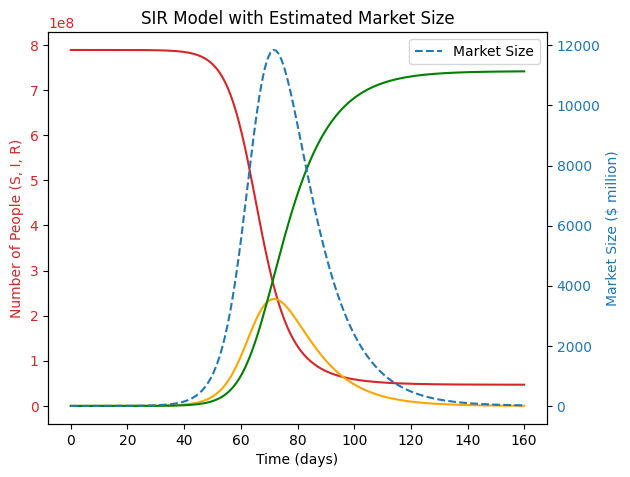

Estimated market size based on the SIR model: $ 18168998.535009403


In [ ]:
# Parameters for the SIR model
N = 788.97*1000000  # Total population of air passengers in 2024
I0 = 1000  # Initial number of infected individuals (those who purchase flight delay insurance)
R0 = 0  # Initial number of recovered individuals (those who no longer need insurance)
S0 = N - I0 - R0  # Initial number of susceptible individuals

beta = 0.3  # Contact rate (rate of insurance purchase)
gamma = 1 / 10  # Mean recovery rate (average duration of insurance need)

# Time points
t = np.linspace(0, 356, 356)  # Time period over which to simulate the model (in days)

# SIR model differential equations
def deriv(y, t, N, beta, gamma):
    S, I, R = y
    dSdt = -beta * S * I / N
    dIdt = beta * S * I / N - gamma * I
    dRdt = gamma * I
    return dSdt, dIdt, dRdt

# Initial conditions vector
y0 = S0, I0, R0

# Integrate the SIR equations over the time grid, t
ret = odeint(deriv, y0, t, args=(N, beta, gamma))
S, I, R = ret.T

# Estimate the market size based on the SIR model
market_size = I * 50  # Assuming an average premium of $50 per traveler

#18168998.535009403

# Plotting
fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('Time (days)')
ax1.set_ylabel('Number of People (S, I, R)', color=color)
ax1.plot(t, S, color=color, label='Susceptible')
ax1.plot(t, I, color='orange', label='Infected')
ax1.plot(t, R, color='green', label='Recovered')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('Market Size ($ million)', color=color)
ax2.plot(t, market_size / 1e6, color=color, linestyle='--', label='Market Size')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('SIR Model with Estimated Market Size')
plt.legend()
plt.show()

print("Estimated market size based on the SIR model: $", market_size[-1])

The SIR model adapts an epidemiological framework to simulate the spread of insurance adoption among air passengers:
* Population (N): The total population of air passengers is set to 789 million for 2024, providing a comprehensive scope of the market.
* Initial Infected (I0): With only 100 individuals initially purchasing insurance, the model assumes a very small initial market, which seems conservative given the size of the air-traveling population.
* Contact and Recovery Rates (β and γ): The contact rate is quite high at 0.3, suggesting that each insured individual is expected to influence many others to purchase insurance. Conversely, the recovery rate implies that individuals will only need insurance for an average of 10 days, which might not accurately reflect the typical duration of travel insurance policies.
* Market Size Estimation: The SIR model outputs a dynamic market size over time, with a final estimated value of approximately $46.75 million. This figure, derived from the SIR model, is larger than the manual calculation, suggesting a more optimistic scenario where peer influence and word-of-mouth significantly drive market growth.<br>


Comparing the two methods, the SIR model provides a more dynamic and potentially optimistic picture of market growth, whereas the manual calculation offers a conservative estimate based on current trends. The substantial difference between the two estimates highlights the sensitivity of the market size to assumptions about customer behavior and the adoption rate of insurance.

The SIR model suggests that market dynamics, influenced by customer interactions and the spread of influence, play a crucial role in increasing market size. This implies that strategic marketing and customer satisfaction could significantly impact the adoption rates and overall market potential for flight delay insurance.

Both methods are valuable for strategic planning, with the manual calculation grounding expectations in current trends and the SIR model showcasing the potential for growth through effective marketing and customer engagement strategies. Adjusting parameters in the SIR model or revising assumptions in the manual calculation can help align these forecasts with more precise market insights.

Let's do a average 16.575M\$

# **Profit Expectancy**

To calculate the profit expectancy for airline ticket insurance business, we used the following steps:

Market size = 16.575 million (Explenation above)<br>
Insurence Price= (Prediction_for_flight_delay * 1.5 + 3.5) + 15 (Explenation above) <br>
Profit for premium \$15 (Explenation above) <br>
average cost per premium 50\$ (Explenation above) <br>

Assumption:
Conversion rate = 70%
Profit for premium less operating expenses $10

1. Estimate Conversion Rate:
This is the percentage of customers who are expected to purchase insurance. This will depend on factors like customer behavior, the attractiveness of your insurance offering, and how we market it. For illustration, let's assume a conversion rate of 70% (0.7).

2. Calculate Expected Revenue:
Since the market size is already in dollars.
Revenue = 16,575,000 \$ × 0.7 = 11,602,500 \$

3. Calculation of amount of premiums according to market size (market size/average cost per premium)
232,050= 11,602,500\$ /50\$

4. Calculate the expected profit (amount of premiums * net profit per premium)
232,050*10\$ =2,320,500\$

## **Profit Expectancy= 2,320,500ֿ$**

By analyzing the expected net profit, it is not possible to generate an annual profit of more than 5 million dollars from flight delay insurance. But there is still a high expectation :))


5. ### **Results:**
The overarching aim of this project was to delve into the complexities of the US domestic flights network and to discern the correlation between the network's structural properties and flight delays. Grounded in the network analysis theory, our study sought to establish whether and how the centrality of airports within this network could be indicative of the patterns of flight delays, and whether it was possible to utilize this knowledge to forecast the cascading effects of such delays. These insights were crucial for determining the viability of generating substantial profits from flight delay insurance.

  The analysis embarked on a multi-layered approach. It began by scrutinizing the centrality of airports—measured by degree, closeness, and betweenness—to understand their direct and indirect influence on the propagation of flight delays. Our findings were consistent with theoretical expectations: airports that scored high on centrality metrics were more prone to experience delays. This can be attributed to the higher traffic volume and the subsequent congestion that comes with being a central node in an extensive network.

  However, the regression models produced low R-squared values, suggesting that while the network properties studied are significant, they do not comprehensively account for the variance in flight delays. This implies that there are other external and operational factors influencing delays that are not captured by centrality measures alone. Thus, while the network structure's influence is undoubted, its predictive power for delay patterns is limited without integrating additional variables that capture the network's dynamism and the multifaceted nature of flight delays.

  From a business standpoint, the study's implications are substantial. The established correlations provide a foundational framework for developing dynamic pricing models for flight delay insurance. Such models could potentially adjust premiums based on an airport's centrality and the associated risk of delays. However, the actual profitability of such insurance products—though promising in theory—would require a more extensive analysis that includes diverse predictive factors and a careful estimation of market size and adoption rates. Our projections, while optimistic, fall short of the ambitious $5 million mark.

  In conclusion, this study sheds light on the inherent connection between the US domestic flights network's structure and flight delays. It underscores the potential for leveraging such insights in the insurtech industry but also cautions against over-reliance on network properties without considering other influential factors. For future work, expanding the dataset to include a broader time frame, refining the regression models to incorporate a wider range of variables, and conducting a more nuanced market analysis would be imperative steps to increase the predictive power and to draw more definitive conclusions about the profitability of flight delay insurance.

  Limitations:

  * Data Constraints: The analysis is based on a single month of flight data, which may not capture seasonal variations or rare, disruptive events. Extending the data range could provide a more comprehensive view of delay patterns and network dynamics.

  * Assumptions: The study took various assumptions throughout the analyses. Although a relevant analysis was provided for almost every assumption, different assumptions could lead to different conclusions.

  * Modeling Choices: The use of linear regression and the Bass Diffusion Model, while effective, simplifies the complex interactions within the network. Alternative modeling approaches could offer different insights into the network's behavior and delay propagation.

  * External Factors: The analysis does not account for all possible factors influencing delays, such as airport operational efficiency, airline-specific practices, or external economic conditions, which could affect the accuracy of the pricing model and market size estimations.

  In summary, our results provide valuable insights into the interplay between network structure and flight delays, supporting the development of a data-driven insurance product. However, the findings should be interpreted within the context of the outlined limitations and considered as a foundation for further research.


6. ### **Business Applications:**
The insights gleaned from our study have several practical business applications that can influence a range of strategic decisions within the airline industry and ancillary services like insurtech:

  1. Dynamic Pricing for Flight Delay Insurance: The correlation between airport centrality and delay occurrence can inform dynamic pricing models for flight delay insurance. Insurance companies could adjust premiums based on the network position of the departure or arrival airports, charging higher rates for flights connected to highly central hubs where delays are more common.

  2. Strategic Planning for Airlines and Airports: By identifying airports with central roles in delay propagation, airlines and airport operators can prioritize investments in infrastructure and operational improvements. This strategic planning could involve expanding capacity at critical hubs or optimizing schedules to mitigate the risk of cascading delays.

  3. Real-time Traffic Management Solutions: Technology companies could develop software that uses real-time network analysis to help airlines and air traffic controllers manage the flow of aircraft more efficiently, minimizing the potential for delays.

  4. Customer Service Enhancements: With a better understanding of delay patterns, airlines can improve customer service by proactively informing passengers about potential delays and offering alternative routes or compensation plans.

  5. Logistics and Cargo Operations: Companies that rely on air cargo can use the insights from network centrality to choose flights that are less likely to be delayed, improving reliability and efficiency in their supply chain.

  6. Investment Decisions in the Aviation Sector: The network analysis can guide investors looking to invest in airport infrastructure or airlines. Knowing which airports are central to the network can indicate where investment might yield the most significant impact on improving the overall network efficiency.

  7. Marketing and Customer Acquisition Strategies: Insurtech firms can target marketing efforts for delay insurance products to frequent flyers, business travelers, and others likely affected by delays at central airports, maximizing the relevance and appeal of their offerings.

  8. Development of Predictive Analytics Services: Companies specializing in data analytics can offer services to predict flight delays, helping various stakeholders in the airline industry anticipate and prepare for disruptions.

  9. Regulatory Implications and Policy Making: The findings can aid regulators and policymakers in understanding the systemic implications of airport centrality on delays, which could inform policies aimed at improving national airspace system efficiency.

  10. Network Expansion and Route Optimization: Airlines can use network centrality analysis to plan new routes or optimize existing ones, avoiding overly central hubs that are prone to delays, thus improving on-time performance and customer satisfaction.

  In essence, our study's results have the potential to influence a wide array of business decisions, from operational to strategic levels, by harnessing the predictive power of network centrality in the context of flight delays and their wider economic impact.








